In [25]:
import pandas as pd
import numpy as np
import os
import math
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from datetime import timedelta

#model related
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

#lstm
from keras.models import Model
from keras.layers import Input, LSTM, Dropout, Dense

#direction prediction
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report

In [26]:
selected_columns = { 'avg' : ['avg_fee', 'avg_value'], 'gas' : ['avg_gas_price_in_wei', 'avg_value_in_wei'], \
                     'transac' : ['avg_count']}

drop_columns = {'avg' : ['date'], 'gas' : ['date'], 'transac' : ['date']}

TIME_STEP = 5

def split_train(df, perc):
    train_size = int(perc * len(df))
    val_size =  int(perc * (len(df) - train_size))
    test_size = (len(df) - train_size) - val_size

    train_data, val_data, test_data = df[:train_size], df[train_size:train_size + val_size], df[train_size + val_size : ]
    print("train size: ", train_data.shape)
    print("validation size: ", val_data.shape)
    print("test size: ", test_data.shape)
    return train_data, val_data, test_data

def split_sequentially(df, num_of_y):
    '''
    Purpose: split data sequentially
    Input: df -> dataframe of data for ml
           num_of_y -> number of y variables to predict (will be sliced from 0 to num_of_y)
           -> with assumption that y variables is at the front
    Output:
        x -> past data used to predict
        y -> future data

    '''
    x, y = [], []
    for i in range(len(df)-TIME_STEP-1):
        x.append(df[i:(i+TIME_STEP), :]) #take every variables in the past to predict the 2 variables in future
        y.append(df[i + TIME_STEP, 0:num_of_y])
    print(len(x), len(y))
    return np.array(x), np.array(y)


In [27]:
def train_sentiment_lstm(x_train, y_train,  x_val, y_val, epochs, batch_size):
    print(x_train.shape[2], x_train.shape)
    input1 = Input(shape=(TIME_STEP, x_train.shape[2]))
    x1 = LSTM(units=10, activation="sigmoid", return_sequences=False)(input1) #tanh not good
    x1 = Dropout(0.05)(x1)
    #x1 = Bidirectional(LSTM(units=10, return_sequences=False))(x1)

    # Output layers
    output1 = Dense(units=NUM_OF_Y, activation='softmax', name='output1')(x1)
    #the model
    model = Model(inputs=input1, outputs={'output1': output1})

    # Compile the model
    model.compile(loss={'output1': 'mean_squared_error'},
                  optimizer='adam',
                  metrics={'output1': ['accuracy'] })
    print(model.summary())

    # Fit the model
    history = model.fit(x_train, {'output1': y_train }, validation_data=(x_val, y_val), epochs=epochs, batch_size=batch_size, verbose=1)

    return model


In [28]:
def get_pred(x_test, y_test, model, scaler_y):
    # Prediction
    y_test_pred = model.predict(x_test)

    # convert to origin scale
    y_test_pred = scaler_y.inverse_transform(y_test_pred['output1'])
    y_test = scaler_y.inverse_transform(y_test.reshape(-1,NUM_OF_Y))

    # Model evaluation
    print("MSE of prediction: ", mean_squared_error(y_test, y_test_pred))
    print("RMSE of prediction: ", math.sqrt(mean_squared_error(y_test, y_test_pred)))
    print("MAE of prediction: ", mean_absolute_error(y_test, y_test_pred))
    #return y_test_pred

In [29]:
def plot_line_graph(df_1, y, network, cols, df_dates):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df_1['date'],
        y=df_1[cols[y]],
        mode='lines'
    ))
    fig.add_shape(
        type="line",
        x0=df_dates.iloc[-1],
        x1=df_dates.iloc[-1],
        y0=0,
        y1=df_1[cols[y]].astype(float).max() + 10,
        line=dict(
            color="red",
            width=1,
            dash="dash",
        )
    )

    # Customize layout
    fig.update_layout(
        title=f'Forecasted {network} {cols[y]}',
        xaxis_title='Date',
        yaxis_title='Value',
        width=700,
        height=600
    )
    fig.show()

In [30]:
import os

directory = '../datasets/network/merged'
selected_columns = { 'avg' : ['avg_fee', 'avg_value'], 'gas' : ['avg_gas_price_in_wei', 'avg_value_in_wei'], \
                     'transac' : ['avg_count']}

drop_columns = {'avg' : ['date'], 'gas' : ['date'], 'transac' : ['date']}


# have 2 kind of file , csv and parquet
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)

    if os.path.isfile(file_path):

        print(filename)
        #read the files
        df = pd.read_csv(file_path)
        df['date'] = pd.to_datetime(df['date'])
        df.sort_values(by='date', inplace=True)

        file_name_splitted = filename.split('_')
        #retrieve respective file columns
        cols = selected_columns.get(file_name_splitted[1], ['Open','High','Low','Close','Volume'])
        del_cols = drop_columns.get(file_name_splitted[1], ['Start','End', 'date', 'Market Cap'])
        del_cols.append('Unnamed: 0')

        df_dates = df.date
        df.drop(columns=del_cols, inplace=True)

        #LSTM model parameters
        TIME_STEP = 5
        EPOCHS = 10
        BATCH_SIZE = 32
        NUM_OF_Y = len(cols)

        train, val, test = split_train(df, 0.8)

        scaler_x = MinMaxScaler()
        scaler_y = MinMaxScaler()

        x_train = scaler_x.fit_transform(train.iloc[:, NUM_OF_Y:])
        x_val = scaler_x.transform(val.iloc[:, NUM_OF_Y:])
        x_test = scaler_x.transform(test.iloc[:, NUM_OF_Y:])

        y_train = scaler_y.fit_transform(train.iloc[:, :NUM_OF_Y])
        y_val = scaler_y.transform(val.iloc[:, :NUM_OF_Y])
        y_test = scaler_y.transform(test.iloc[:, :NUM_OF_Y])

        train = np.concatenate((y_train, x_train), axis=1)
        val = np.concatenate((y_val, x_val), axis=1)
        test = np.concatenate((y_test, x_test), axis=1)

        x_train, y_train = split_sequentially(train, NUM_OF_Y)
        x_val, y_val = split_sequentially(val, NUM_OF_Y)
        x_test, y_test = split_sequentially(test, NUM_OF_Y)
        #x_train, y_train, train


        model = train_sentiment_lstm(x_train, y_train,  x_val, y_val, EPOCHS, BATCH_SIZE)
        #get_pred(x_test, y_test, model, scaler_y)

        predictions = np.array([])

        #predict for next day
        x_test = np.array(test[-TIME_STEP:]).reshape(-1, TIME_STEP, df.shape[1])
        pred = model.predict(x_test)['output1']
        predictions = np.append(predictions, pred)


        #cols.append('date')
        forecasted = pd.concat([df[cols], df_dates], axis=1)

        start_date = pd.to_datetime(df_dates.iloc[-1]) + timedelta(days=1) #get the last date + 1 day (for forecast)

        predictions = scaler_y.inverse_transform(predictions.reshape(-1,NUM_OF_Y)) #convert back

        plot_df = pd.DataFrame({'date': [start_date]})
        pred_df = pd.DataFrame(predictions, columns = cols)
        pred_df = pd.concat([plot_df , pred_df], axis=1)

        forecasted = pd.concat([forecasted, pred_df])
        forecasted['date'] = pd.to_datetime(forecasted['date'])

        network = file_name_splitted[0]

        if 'Open' not in cols:
            for y in range(0,NUM_OF_Y):
                plot_line_graph(forecasted, y, network, cols, df_dates)
        else :
            fig = go.Figure()
            fig.add_trace(go.Candlestick(x=forecasted.date,
                            open=forecasted['Open'],
                            high=forecasted['High'],
                            low=forecasted['Low'],
                            close=forecasted['Close'])
                         )
            fig.add_shape(
                type="line",
                x0=df_dates.iloc[-1],
                x1=df_dates.iloc[-1],
                y0=0,
                y1=forecasted.Open.max() + 10,
                line=dict(
                    color="red",
                    width=1,
                    dash="dash",
                )
            )

            fig.update_layout(xaxis_rangeslider_visible=False,
                             title = f'{network} prices over time',
                             xaxis_title="Date (drag to chose specific time frame)"
                             )
            fig.show()
            plot_line_graph(forecasted, 0, network, ['Volume'], df_dates)

dogecoin_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (4488, 93)
validation size:  (898, 93)
test size:  (225, 93)
4482 4482
892 892
219 219
93 (4482, 5, 93)


Model: "functional_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_70 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_70 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_70 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2207 - loss: 0.0267 - val_accuracy: 0.2646 - val_loss: 0.1135
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5730 - loss: 0.0257 - val_accuracy: 0.2679 - val_loss: 0.1135
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5802 - loss: 0.0249 - val_accuracy: 0.2679 - val_loss: 0.1097
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5893 - loss: 0.0242 - val_accuracy: 0.2679 - val_loss: 0.1047
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6083 - loss: 0.0242 - val_accuracy: 0.3262 - val_loss: 0.0981
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5856 - loss: 0.0233 - val_accuracy: 0.6177 - val_loss: 0.0925
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5959 - loss: 0.0240 - val_accuracy: 0.8397 - val_loss: 0.0839
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6473 - loss: 0.0237 - val_accurac

doge_avg_all.csv_and_tweets.csv
train size:  (4144, 90)
validation size:  (829, 90)
test size:  (208, 90)
4138 4138
823 823
202 202
90 (4138, 5, 90)


Model: "functional_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_71 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_71 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_71 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5244 - loss: 0.1373 - val_accuracy: 0.8445 - val_loss: 0.2198
Epoch 2/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5764 - loss: 0.1351 - val_accuracy: 0.8445 - val_loss: 0.2198
Epoch 3/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6222 - loss: 0.1322 - val_accuracy: 0.8238 - val_loss: 0.2196
Epoch 4/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6886 - loss: 0.1272 - val_accuracy: 0.6962 - val_loss: 0.2196
Epoch 5/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7262 - loss: 0.1258 - val_accuracy: 0.7874 - val_loss: 0.2195
Epoch 6/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7768 - loss: 0.1239 - val_accuracy: 0.7849 - val_loss: 0.2194
Epoch 7/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8024 - loss: 0.1223 - val_accuracy: 0.7303 - val_loss: 0.2192
Epoch 8/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8036 - loss: 0.1240 - val_accurac

doge_transac_all.csv_and_tweets.csv
train size:  (4144, 89)
validation size:  (829, 89)
test size:  (208, 89)
4138 4138
823 823
202 202
89 (4138, 5, 89)


Model: "functional_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_72 (InputLayer)     │ (None, 5, 89)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_72 (LSTM)                  │ (None, 10)             │         4,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_72 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,011 (15.67 KB)

 Trainable params: 4,011 (15.67 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



130/130 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 8.6547e-05 - loss: 0.9737 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 2/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 2.3797e-04 - loss: 0.9743 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 3/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 1.2616e-04 - loss: 0.9737 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 4/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.0837e-04 - loss: 0.9736 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 5/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 3.5656e-04 - loss: 0.9754 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 6/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 2.9933e-04 - loss: 0.9763 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 7/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 2.6947e-04 - loss: 0.9741 - val_accuracy: 0.0000e+00 - val_loss: 0.7129
Epoch 8/10
130/130 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accur

c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



ethereum_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (4488, 93)
validation size:  (898, 93)
test size:  (225, 93)
4482 4482
892 892
219 219
93 (4482, 5, 93)


Model: "functional_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_73 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_73 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_73 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.1951 - loss: 0.0889 - val_accuracy: 0.3016 - val_loss: 0.1359
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2005 - loss: 0.0830 - val_accuracy: 0.3105 - val_loss: 0.1351
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2376 - loss: 0.0837 - val_accuracy: 0.3072 - val_loss: 0.1349
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2937 - loss: 0.0826 - val_accuracy: 0.3072 - val_loss: 0.1336
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3545 - loss: 0.0813 - val_accuracy: 0.3061 - val_loss: 0.1325
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3837 - loss: 0.0792 - val_accuracy: 0.3027 - val_loss: 0.1318
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3907 - loss: 0.0807 - val_accuracy: 0.3027 - val_loss: 0.1316
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4170 - loss: 0.0790 - val_accurac

eth_gas_all.csv_and_tweets.csv
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)
4490 4490
893 893
219 219
90 (4490, 5, 90)


Model: "functional_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_74 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_74 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_74 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6305 - loss: 0.1527 - val_accuracy: 0.9776 - val_loss: 0.2067
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6755 - loss: 0.1527 - val_accuracy: 0.9731 - val_loss: 0.2068
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6945 - loss: 0.1527 - val_accuracy: 0.9776 - val_loss: 0.2067
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7106 - loss: 0.1527 - val_accuracy: 0.9776 - val_loss: 0.2067
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7239 - loss: 0.1515 - val_accuracy: 0.9765 - val_loss: 0.2067
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7470 - loss: 0.1508 - val_accuracy: 0.9518 - val_loss: 0.2067
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7602 - loss: 0.1507 - val_accuracy: 0.9563 - val_loss: 0.2067
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7883 - loss: 0.1510 - val_accurac

eth_transac_all.csv_and_tweets.csv
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)
4490 4490
893 893
219 219
90 (4490, 5, 90)


Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_75 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_75 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_75 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,051 (15.82 KB)

 Trainable params: 4,051 (15.82 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 4.0613e-05 - loss: 0.2487 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 3.7868e-04 - loss: 0.2500 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 8.8101e-05 - loss: 0.2515 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.2741e-05 - loss: 0.2467 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.1503e-04 - loss: 0.2442 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 8.1500e-04 - loss: 0.2513 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 6.4785e-04 - loss: 0.2482 - val_accuracy: 0.0000e+00 - val_loss: 0.2817
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accur

c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



fanthom_gas_all.csv_and_tweets.csv
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)
4490 4490
893 893
219 219
90 (4490, 5, 90)


Model: "functional_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_76 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_76 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_76 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6977 - loss: 0.2332 - val_accuracy: 0.9664 - val_loss: 0.2452
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7232 - loss: 0.2324 - val_accuracy: 0.9462 - val_loss: 0.2451
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7323 - loss: 0.2320 - val_accuracy: 0.9451 - val_loss: 0.2451
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7537 - loss: 0.2318 - val_accuracy: 0.9272 - val_loss: 0.2450
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7703 - loss: 0.2320 - val_accuracy: 0.9384 - val_loss: 0.2450
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7761 - loss: 0.2315 - val_accuracy: 0.9306 - val_loss: 0.2450
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7887 - loss: 0.2307 - val_accuracy: 0.8914 - val_loss: 0.2450
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7976 - loss: 0.2309 - val_accurac

fantom_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (4488, 93)
validation size:  (898, 93)
test size:  (225, 93)
4482 4482
892 892
219 219
93 (4482, 5, 93)


Model: "functional_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_77 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_77 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_77 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4983 - loss: 0.0491 - val_accuracy: 0.4249 - val_loss: 0.0040
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3092 - loss: 0.0479 - val_accuracy: 0.4114 - val_loss: 0.0040
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3255 - loss: 0.0467 - val_accuracy: 0.4406 - val_loss: 0.0041
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2915 - loss: 0.0469 - val_accuracy: 0.5146 - val_loss: 0.0040
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.2970 - loss: 0.0469 - val_accuracy: 0.5179 - val_loss: 0.0039
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3300 - loss: 0.0452 - val_accuracy: 0.4529 - val_loss: 0.0039
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.3285 - loss: 0.0467 - val_accuracy: 0.4798 - val_loss: 0.0039
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3519 - loss: 0.0476 - val_accurac

optimisim_gas_all.csv_and_tweets.csv
train size:  (2736, 90)
validation size:  (547, 90)
test size:  (137, 90)
2730 2730
541 541
131 131
90 (2730, 5, 90)


Model: "functional_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_78 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_78 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_78 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3956 - loss: 0.2002 - val_accuracy: 0.3993 - val_loss: 0.2025
Epoch 2/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6476 - loss: 0.1948 - val_accuracy: 0.3900 - val_loss: 0.2024
Epoch 3/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6845 - loss: 0.1942 - val_accuracy: 0.4011 - val_loss: 0.2024
Epoch 4/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6834 - loss: 0.1945 - val_accuracy: 0.4030 - val_loss: 0.2023
Epoch 5/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6877 - loss: 0.1942 - val_accuracy: 0.4325 - val_loss: 0.2023
Epoch 6/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6868 - loss: 0.1935 - val_accuracy: 0.5287 - val_loss: 0.2022
Epoch 7/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7203 - loss: 0.1941 - val_accuracy: 0.4861 - val_loss: 0.2022
Epoch 8/10
86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7172 - loss: 0.1929 - val_accuracy: 0.5508 - val_

optimism_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (2008, 93)
validation size:  (401, 93)
test size:  (101, 93)
2002 2002
395 395
95 95
93 (2002, 5, 93)


Model: "functional_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_79 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_79 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_79 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1577 - loss: 0.0484 - val_accuracy: 0.3823 - val_loss: 0.0287
Epoch 2/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3099 - loss: 0.0464 - val_accuracy: 0.3139 - val_loss: 0.0287
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2905 - loss: 0.0476 - val_accuracy: 0.2911 - val_loss: 0.0286
Epoch 4/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2907 - loss: 0.0515 - val_accuracy: 0.3266 - val_loss: 0.0286
Epoch 5/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3213 - loss: 0.0476 - val_accuracy: 0.2785 - val_loss: 0.0286
Epoch 6/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2522 - loss: 0.0450 - val_accuracy: 0.3544 - val_loss: 0.0286
Epoch 7/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2997 - loss: 0.0519 - val_accuracy: 0.3671 - val_loss: 0.0285
Epoch 8/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2863 - loss: 0.0468 - val_accuracy: 0.3823 - val_

polygon_ecosystem-token_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (1075, 93)
validation size:  (215, 93)
test size:  (54, 93)
1069 1069
209 209
48 48
93 (1069, 5, 93)


Model: "functional_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_80 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_80 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_80 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.2223 - loss: 0.0988 - val_accuracy: 1.0000 - val_loss: 0.1901
Epoch 2/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2191 - loss: 0.0809 - val_accuracy: 0.1962 - val_loss: 0.2062
Epoch 3/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0865 - loss: 0.0846 - val_accuracy: 0.0000e+00 - val_loss: 0.2163
Epoch 4/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0864 - loss: 0.0725 - val_accuracy: 0.0000e+00 - val_loss: 0.2227
Epoch 5/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0704 - loss: 0.0766 - val_accuracy: 0.0000e+00 - val_loss: 0.2273
Epoch 6/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.0676 - loss: 0.0723 - val_accuracy: 0.0000e+00 - val_loss: 0.2310
Epoch 7/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0901 - loss: 0.0719 - val_accuracy: 0.0000e+00 - val_loss: 0.2337
Epoch 8/10
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1123 - loss: 0.0704 - val_a

polygon_gas_all.csv_and_tweets.csv
train size:  (4241, 90)
validation size:  (848, 90)
test size:  (213, 90)
4235 4235
842 842
207 207
90 (4235, 5, 90)


Model: "functional_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_81 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_81 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_81 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5980 - loss: 0.2125 - val_accuracy: 0.5546 - val_loss: 0.1982
Epoch 2/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5949 - loss: 0.2057 - val_accuracy: 0.5748 - val_loss: 0.1982
Epoch 3/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6445 - loss: 0.2048 - val_accuracy: 0.6235 - val_loss: 0.1981
Epoch 4/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6891 - loss: 0.2047 - val_accuracy: 0.5914 - val_loss: 0.1981
Epoch 5/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6866 - loss: 0.2042 - val_accuracy: 0.6271 - val_loss: 0.1980
Epoch 6/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7017 - loss: 0.2043 - val_accuracy: 0.6200 - val_loss: 0.1980
Epoch 7/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7040 - loss: 0.2042 - val_accuracy: 0.6413 - val_loss: 0.1980
Epoch 8/10
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7040 - loss: 0.2037 - val_accurac

polygon_transac_all.csv_and_tweets.csv
train size:  (2384, 90)
validation size:  (477, 90)
test size:  (120, 90)
2378 2378
471 471
114 114
90 (2378, 5, 90)


Model: "functional_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_82 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_82 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_82 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,051 (15.82 KB)

 Trainable params: 4,051 (15.82 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



75/75 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 1.0351e-04 - loss: 0.7221 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 2/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 1.4721e-04 - loss: 0.7172 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 3/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 5.2203e-04 - loss: 0.7166 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 4/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 1.2478e-04 - loss: 0.7129 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 5/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.1757e-04 - loss: 0.7121 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 6/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 3.0443e-04 - loss: 0.7166 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 7/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 6.3084e-04 - loss: 0.7164 - val_accuracy: 0.0000e+00 - val_loss: 0.5516
Epoch 8/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 2.2256e-05

c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



solana_avg_all.csv_and_tweets.csv
train size:  (3912, 90)
validation size:  (783, 90)
test size:  (196, 90)
3906 3906
777 777
190 190
90 (3906, 5, 90)


Model: "functional_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_83 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_83 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_83 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9680 - loss: 0.2598 - val_accuracy: 0.8430 - val_loss: 0.2395
Epoch 2/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7575 - loss: 0.2437 - val_accuracy: 0.8597 - val_loss: 0.2395
Epoch 3/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7649 - loss: 0.2432 - val_accuracy: 0.8919 - val_loss: 0.2394
Epoch 4/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7778 - loss: 0.2432 - val_accuracy: 0.9086 - val_loss: 0.2394
Epoch 5/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7919 - loss: 0.2433 - val_accuracy: 0.9266 - val_loss: 0.2394
Epoch 6/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8213 - loss: 0.2428 - val_accuracy: 0.9189 - val_loss: 0.2394
Epoch 7/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8030 - loss: 0.2431 - val_accuracy: 0.9279 - val_loss: 0.2394
Epoch 8/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8196 - loss: 0.2429 - val_accurac

solana_transac_all.csv_and_tweets.csv
train size:  (3914, 89)
validation size:  (783, 89)
test size:  (196, 89)
3908 3908
777 777
190 190
89 (3908, 5, 89)


Model: "functional_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_84 (InputLayer)     │ (None, 5, 89)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_84 (LSTM)                  │ (None, 10)             │         4,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_84 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,011 (15.67 KB)

 Trainable params: 4,011 (15.67 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



123/123 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.0015 - loss: 0.3478 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 2/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0010 - loss: 0.3529 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 3/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0011 - loss: 0.3453 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 4/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0015 - loss: 0.3521 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 5/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0011 - loss: 0.3581 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 6/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 9.3282e-04 - loss: 0.3613 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 7/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0029 - loss: 0.3569 - val_accuracy: 0.0000e+00 - val_loss: 0.2805
Epoch 8/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0018 - loss: 0.35

c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



tron_2020-01-01_2024-12-31.csv_and_tweets.csv
train size:  (4488, 93)
validation size:  (898, 93)
test size:  (225, 93)
4482 4482
892 892
219 219
93 (4482, 5, 93)


Model: "functional_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_85 (InputLayer)     │ (None, 5, 93)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_85 (LSTM)                  │ (None, 10)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_85 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215 (16.46 KB)

 Trainable params: 4,215 (16.46 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3054 - loss: 0.0513 - val_accuracy: 0.8117 - val_loss: 0.3553
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4870 - loss: 0.0450 - val_accuracy: 0.7646 - val_loss: 0.3511
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5142 - loss: 0.0458 - val_accuracy: 0.8453 - val_loss: 0.3497
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5726 - loss: 0.0457 - val_accuracy: 0.9047 - val_loss: 0.3488
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5953 - loss: 0.0462 - val_accuracy: 0.9047 - val_loss: 0.3483
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6082 - loss: 0.0434 - val_accuracy: 0.9047 - val_loss: 0.3479
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6305 - loss: 0.0449 - val_accuracy: 0.9058 - val_loss: 0.3475
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6658 - loss: 0.0435 - val_accurac

tron_gas_all.csv_and_tweets.csv
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)
4490 4490
893 893
219 219
90 (4490, 5, 90)


Model: "functional_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_86 (InputLayer)     │ (None, 5, 90)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_86 (LSTM)                  │ (None, 10)             │         4,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_86 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,062 (15.87 KB)

 Trainable params: 4,062 (15.87 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.2893 - loss: 0.2341 - val_accuracy: 1.0000 - val_loss: 0.0871
Epoch 2/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8675 - loss: 0.1156 - val_accuracy: 1.0000 - val_loss: 0.0619
Epoch 3/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8532 - loss: 0.1136 - val_accuracy: 1.0000 - val_loss: 0.0568
Epoch 4/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8628 - loss: 0.1080 - val_accuracy: 1.0000 - val_loss: 0.0541
Epoch 5/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8693 - loss: 0.1051 - val_accuracy: 1.0000 - val_loss: 0.0513
Epoch 6/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8813 - loss: 0.1033 - val_accuracy: 1.0000 - val_loss: 0.0475
Epoch 7/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8887 - loss: 0.1033 - val_accuracy: 1.0000 - val_loss: 0.0441
Epoch 8/10
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8978 - loss: 0.0954 - val_accurac

In [31]:
#logistics

def binary_outcomes_model(train_x, train_y, val_x, val_y, model, cols):
    model.fit(train_x, train_y)

    pred = model.predict_proba(val_x)
    for x in range(0, len(cols)):
        if len(val_y.iloc[:, x].value_counts()) > 1:
            if (len(cols) > 1):
                scores = roc_auc_score(val_y.iloc[:, x], pred[x][:, 1])
            else:
                scores = roc_auc_score(val_y.iloc[:, x], pred[:, 1])
            print(cols[x])
            print(scores)
        else:
            print('lack of difference')

def log_model(train_x, train_y, val_x, val_y, model, cols):
    print("\n logistic regression")
    for x in range(0, len(cols)):
        if len(val_y.iloc[:, x].value_counts()) > 1:
            model.fit(train_x, train_y.iloc[:, x])

            pred = model.predict_proba(val_x)
            scores = roc_auc_score(val_y.iloc[:, x], pred[:, 1])
            print(cols[x])
            print(scores)
        else:
            print('lack of difference')


def xgb_getfeaturesimpt(train_x, train_y, val_x, val_y, model, cols):
    for x in range(0, len(cols)):
        if len(val_y.iloc[:, x].value_counts()) > 1:
            model.fit(train_x, train_y.iloc[:, x])

            pred = model.predict(val_x)

            print(cols[x])
            print(classification_report(val_y.iloc[:, x], (pred >= 0.5).astype(int), target_names=[f'{cols[x]} down', f'{cols[x]} up']))
            sorted_idx = (-model.feature_importances_).argsort()
            plt.figure()
            plt.bar(train_x.columns[sorted_idx[:10]], model.feature_importances_[sorted_idx[:10]])
            plt.xticks(rotation=90)
            plt.show()
        else:
            print('lack of difference')
        '''
        print("MSE of prediction: ", mean_squared_error(val_y.iloc[:, x], pred))
        print("RMSE of prediction: ", math.sqrt(mean_squared_error(val_y.iloc[:, x], pred)))
        print("MAE of prediction: ", mean_absolute_error(val_y.iloc[:, x], pred))
        '''


# Predict direction

dogecoin_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ...  0.000015               1
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ... -0.000034               0
5606        5606  2020-01-04  ...  0.000030               1

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -0.000006               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ...  0.000031               1
5606        5606  2020-01-04  ...  0.000046               1

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
5610        5610  2020-01-01  ...       NaN              0
5609        5609  2020-01-02  ... -0.000035              0
5608 

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Low_direction
0.5638850680116154
Close_direction
0.5511323550162269
Volume_direction
0.5582753770414941


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Open_direction
                     precision    recall  f1-score   support

Open_direction down       0.82      0.91      0.86       748
  Open_direction up       0.07      0.03      0.04       150

           accuracy                           0.76       898
          macro avg       0.45      0.47      0.45       898
       weighted avg       0.70      0.76      0.73       898



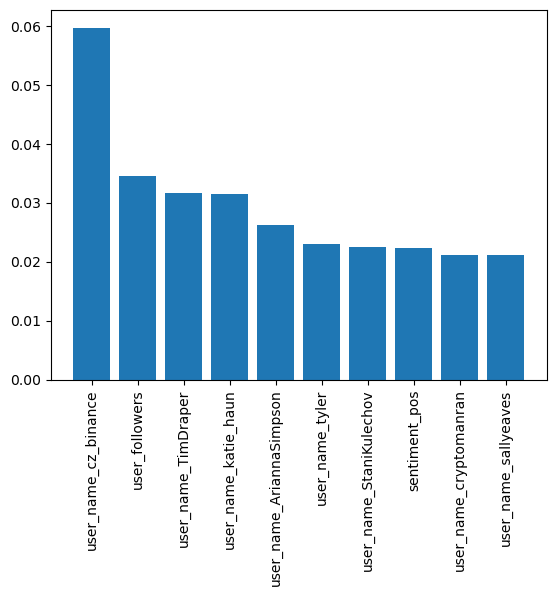

High_direction
                     precision    recall  f1-score   support

High_direction down       0.84      0.98      0.90       749
  High_direction up       0.22      0.03      0.05       149

           accuracy                           0.82       898
          macro avg       0.53      0.50      0.48       898
       weighted avg       0.73      0.82      0.76       898



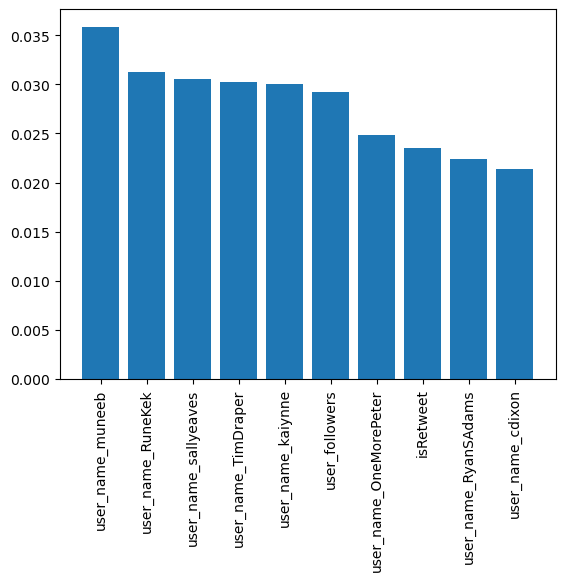

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.82      0.87      0.85       727
  Low_direction up       0.27      0.20      0.23       171

          accuracy                           0.74       898
         macro avg       0.55      0.54      0.54       898
      weighted avg       0.72      0.74      0.73       898



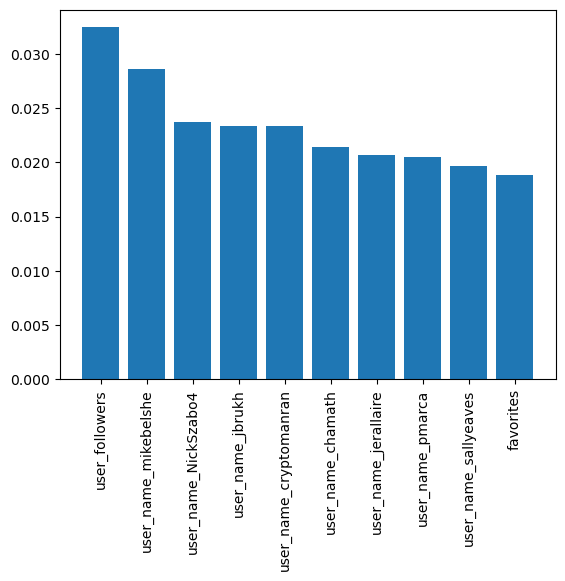

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.82      0.91      0.86       746
  Close_direction up       0.03      0.01      0.02       152

            accuracy                           0.76       898
           macro avg       0.42      0.46      0.44       898
        weighted avg       0.68      0.76      0.72       898



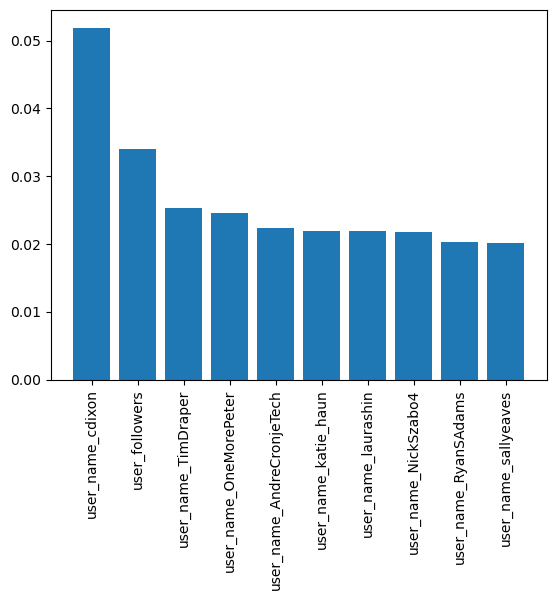

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.84      0.92      0.88       764
  Volume_direction up       0.03      0.01      0.02       134

             accuracy                           0.78       898
            macro avg       0.44      0.47      0.45       898
         weighted avg       0.72      0.78      0.75       898



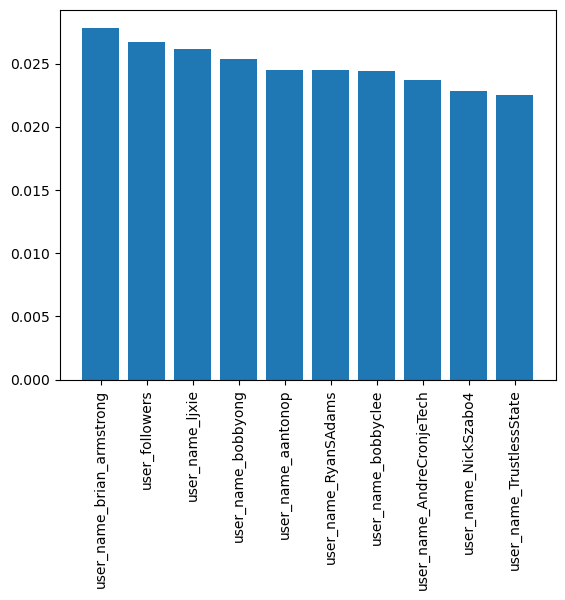

doge_avg_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_fee_diff  avg_fee_direction
0           0 2020-01-01  ...           NaN                  0
1           1 2020-01-02  ... -3.134508e+07                  0
2           2 2020-01-02  ...  0.000000e+00                  0
3           3 2020-01-03  ... -1.858399e+07                  0
4           4 2020-01-04  ...  1.507339e+07                  1

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_diff  avg_value_direction
0           0 2020-01-01  ...             NaN                    0
1           1 2020-01-02  ...    9.569670e+12                    1
2           2 2020-01-02  ...    0.000000e+00                    0
3           3 2020-01-03  ...   -1.662595e+12                    0
4           4 2020-01-04  ...   -3.098079e+12                    0

[5 rows x 96 columns]
train size:  (4144, 90)
validation size:  (829, 90)
test size:  (208, 90)

 random forest
avg_fee_direction
0.5667948082010582
avg_value_direc

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_fee_direction
                        precision    recall  f1-score   support

avg_fee_direction down       0.79      0.81      0.80       640
  avg_fee_direction up       0.31      0.29      0.30       189

              accuracy                           0.69       829
             macro avg       0.55      0.55      0.55       829
          weighted avg       0.68      0.69      0.69       829



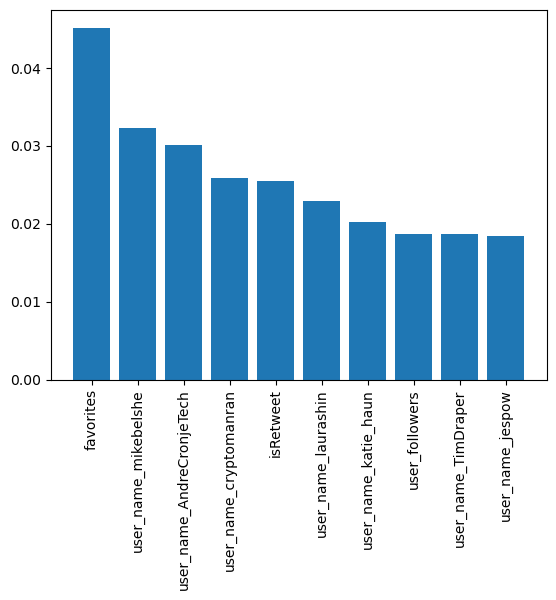

avg_value_direction
                          precision    recall  f1-score   support

avg_value_direction down       0.79      0.96      0.86       656
  avg_value_direction up       0.07      0.01      0.02       173

                accuracy                           0.76       829
               macro avg       0.43      0.49      0.44       829
            weighted avg       0.64      0.76      0.69       829



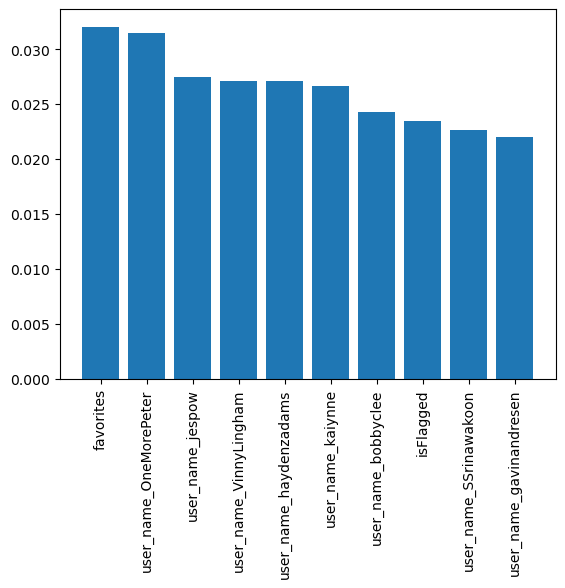

doge_transac_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_count_diff  avg_count_direction
0           0 2020-01-01  ...             NaN                    0
1           1 2020-01-02  ...        1.002177                    1
2           2 2020-01-02  ...        0.000000                    0
3           3 2020-01-03  ...        0.487711                    1
4           4 2020-01-04  ...       -0.176374                    0

[5 rows x 93 columns]
train size:  (4144, 89)
validation size:  (829, 89)
test size:  (208, 89)

 random forest


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



avg_count_direction
0.602184499670722

 logistic regression
avg_count_direction
0.5804868115489932
avg_count_direction
                          precision    recall  f1-score   support

avg_count_direction down       0.78      0.97      0.87       652
  avg_count_direction up       0.10      0.01      0.02       177

                accuracy                           0.77       829
               macro avg       0.44      0.49      0.44       829
            weighted avg       0.64      0.77      0.69       829



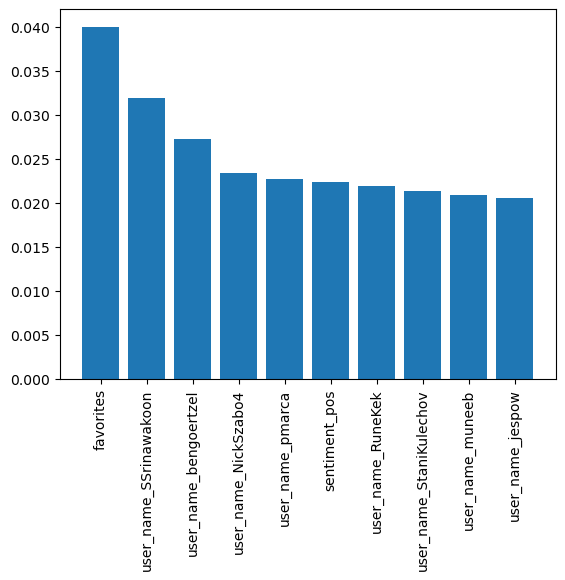

ethereum_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ...  1.186237               1
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ... -3.837936               0
5606        5606  2020-01-04  ...  6.718457               1

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -1.672313               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ...  3.273562               1
5606        5606  2020-01-04  ...  0.702152               1

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
5610        5610  2020-01-01  ...       NaN              0
5609        5609  2020-01-02  ... -2.456648              0
5608 

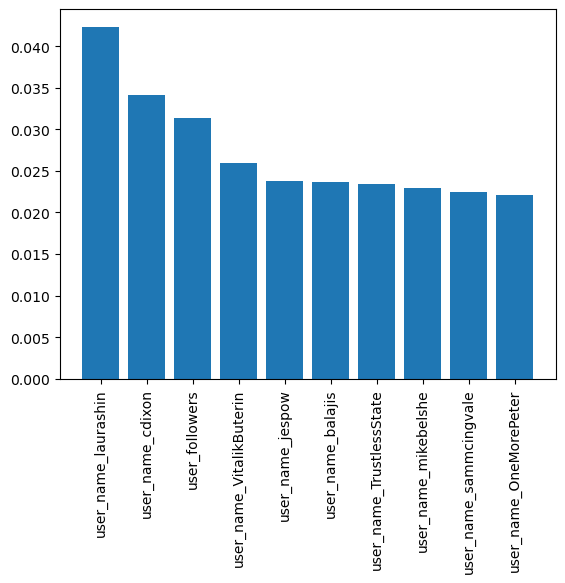

High_direction
                     precision    recall  f1-score   support

High_direction down       0.84      0.97      0.90       756
  High_direction up       0.07      0.01      0.02       142

           accuracy                           0.82       898
          macro avg       0.46      0.49      0.46       898
       weighted avg       0.72      0.82      0.76       898



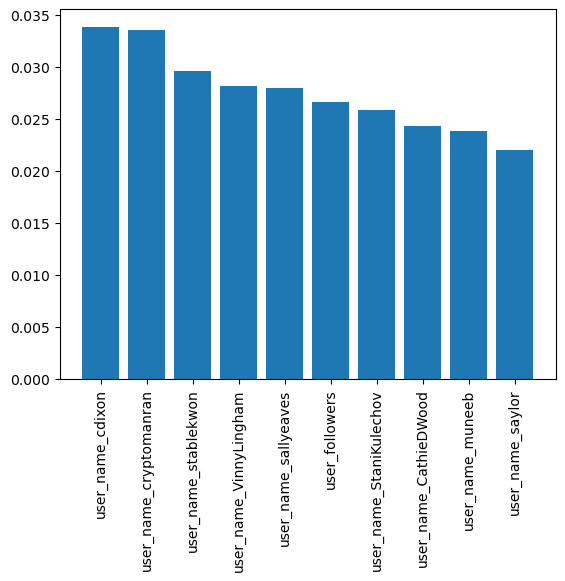

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.82      0.85      0.84       730
  Low_direction up       0.23      0.18      0.20       168

          accuracy                           0.73       898
         macro avg       0.52      0.52      0.52       898
      weighted avg       0.71      0.73      0.72       898



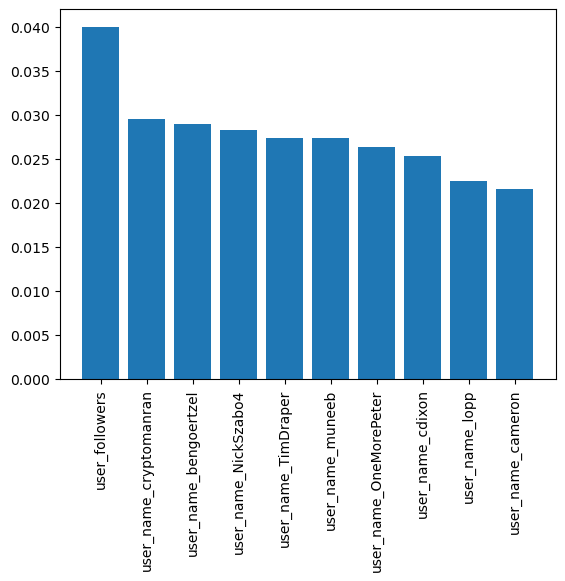

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.82      0.90      0.86       743
  Close_direction up       0.04      0.02      0.03       155

            accuracy                           0.75       898
           macro avg       0.43      0.46      0.44       898
        weighted avg       0.68      0.75      0.71       898



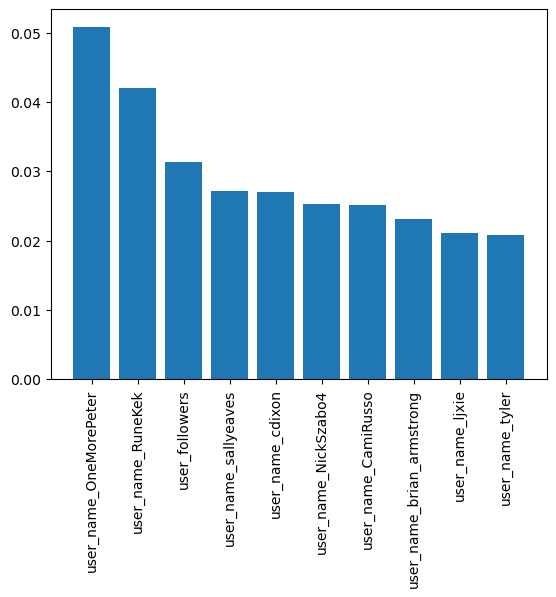

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.84      0.98      0.91       760
  Volume_direction up       0.06      0.01      0.01       138

             accuracy                           0.83       898
            macro avg       0.45      0.49      0.46       898
         weighted avg       0.72      0.83      0.77       898



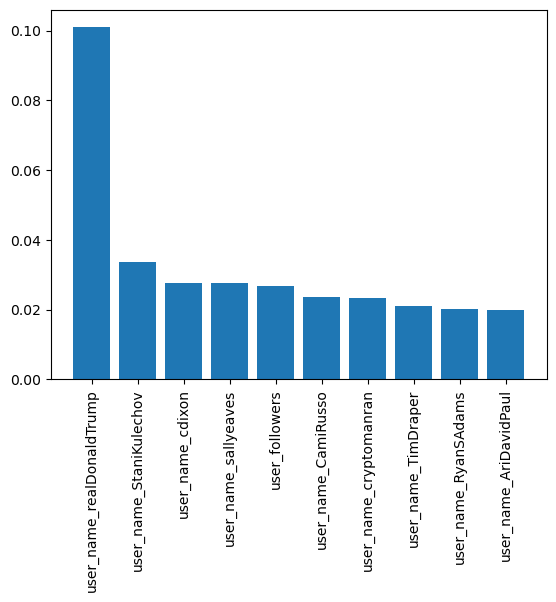

eth_gas_all.csv_and_tweets.csv
   Unnamed: 0  ... avg_gas_price_in_wei_direction
0           0  ...                              0
1           1  ...                              0
2           2  ...                              0
3           3  ...                              1
4           4  ...                              0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_in_wei_diff  avg_value_in_wei_direction
0           0 2020-01-01  ...                    NaN                           0
1           1 2020-01-02  ...           8.871770e+17                           1
2           2 2020-01-02  ...           0.000000e+00                           0
3           3 2020-01-03  ...           9.730299e+17                           1
4           4 2020-01-04  ...          -1.159003e+18                           0

[5 rows x 96 columns]
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)

 random forest
avg_gas_price_in_wei_direction
0.57945252569112

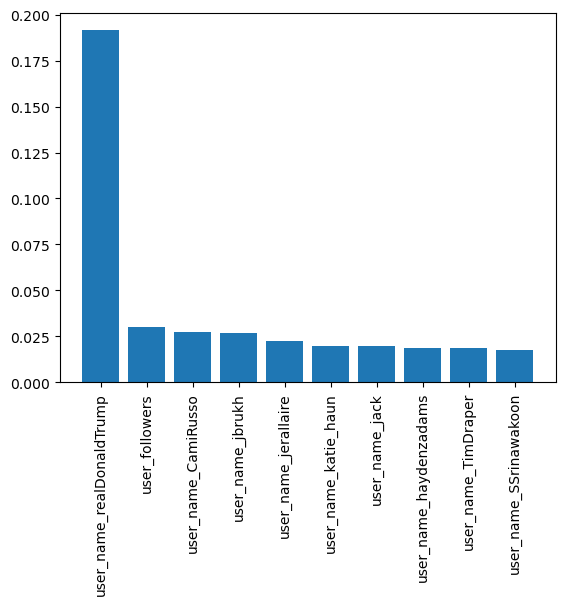

avg_value_in_wei_direction
                                 precision    recall  f1-score   support

avg_value_in_wei_direction down       0.85      0.95      0.90       762
  avg_value_in_wei_direction up       0.17      0.06      0.09       137

                       accuracy                           0.81       899
                      macro avg       0.51      0.50      0.49       899
                   weighted avg       0.75      0.81      0.77       899



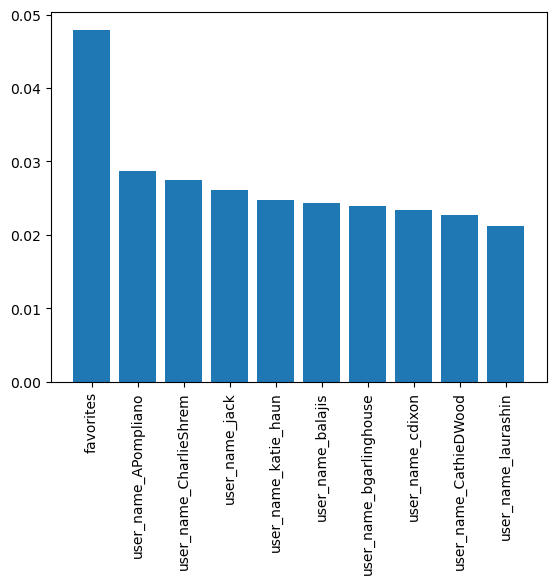

eth_transac_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_count_diff  avg_count_direction
0           0 2020-01-01  ...             NaN                    0
1           1 2020-01-02  ...       -4.643294                    0
2           2 2020-01-02  ...        0.000000                    0
3           3 2020-01-03  ...        0.144760                    1
4           4 2020-01-04  ...       -4.086409                    0

[5 rows x 94 columns]
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)

 random forest


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



avg_count_direction
0.5532141047908525

 logistic regression
avg_count_direction
0.51945831524099
avg_count_direction
                          precision    recall  f1-score   support

avg_count_direction down       0.85      0.94      0.89       752
  avg_count_direction up       0.31      0.13      0.18       147

                accuracy                           0.81       899
               macro avg       0.58      0.54      0.54       899
            weighted avg       0.76      0.81      0.78       899



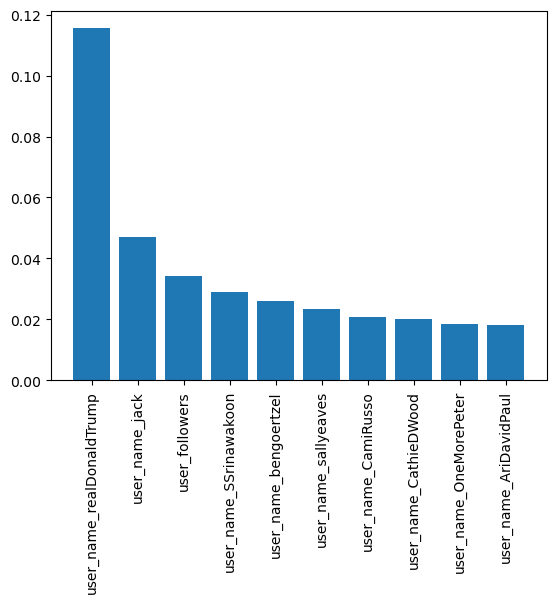

fanthom_gas_all.csv_and_tweets.csv
   Unnamed: 0  ... avg_gas_price_in_wei_direction
0           0  ...                              0
1           1  ...                              0
2           2  ...                              0
3           3  ...                              0
4           4  ...                              0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_in_wei_diff avg_value_in_wei_direction
0           0 2020-01-01  ...                    NaN                          0
1           1 2020-01-02  ...           3.434875e+23                          1
2           2 2020-01-02  ...           0.000000e+00                          0
3           3 2020-01-03  ...          -4.872015e+23                          0
4           4 2020-01-04  ...           1.527752e+22                          1

[5 rows x 96 columns]
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)

 random forest
avg_gas_price_in_wei_direction
0.6127687077239083

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_gas_price_in_wei_direction
                                     precision    recall  f1-score   support

avg_gas_price_in_wei_direction down       0.83      0.91      0.87       748
  avg_gas_price_in_wei_direction up       0.11      0.05      0.07       151

                           accuracy                           0.77       899
                          macro avg       0.47      0.48      0.47       899
                       weighted avg       0.71      0.77      0.73       899



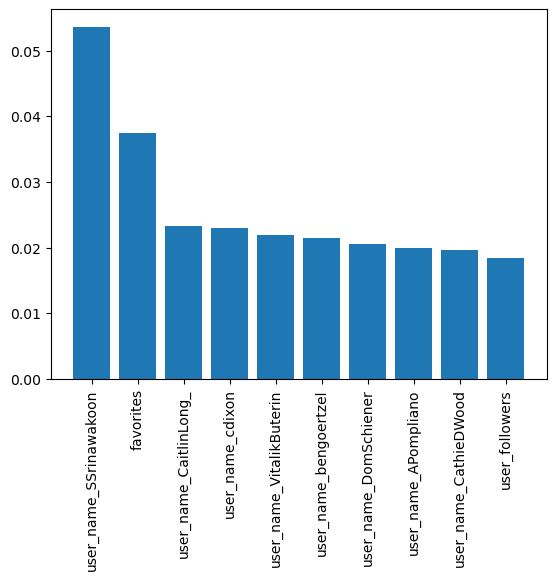

avg_value_in_wei_direction
                                 precision    recall  f1-score   support

avg_value_in_wei_direction down       0.84      0.97      0.90       750
  avg_value_in_wei_direction up       0.29      0.05      0.09       149

                       accuracy                           0.82       899
                      macro avg       0.56      0.51      0.50       899
                   weighted avg       0.75      0.82      0.77       899



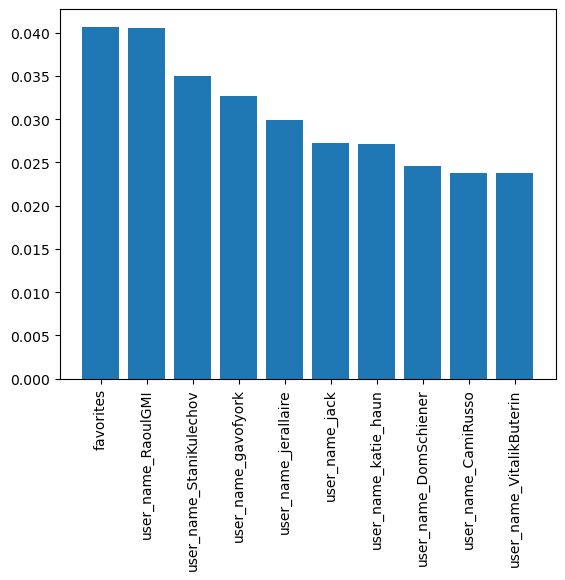

fantom_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -0.000262               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ... -0.000356               0
5606        5606  2020-01-04  ...  0.000077               1

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -0.000245               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ... -0.000262               0
5606        5606  2020-01-04  ...  0.000192               1

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
5610        5610  2020-01-01  ...       NaN              0
5609        5609  2020-01-02  ... -0.000326              0
5608   

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Low_direction
0.5623503092512173
Close_direction
0.5702899899820031
Volume_direction
0.5594924081836232
Open_direction
                     precision    recall  f1-score   support

Open_direction down       0.82      0.90      0.86       751
  Open_direction up       0.03      0.01      0.02       147

           accuracy                           0.76       898
          macro avg       0.42      0.46      0.44       898
       weighted avg       0.69      0.76      0.72       898



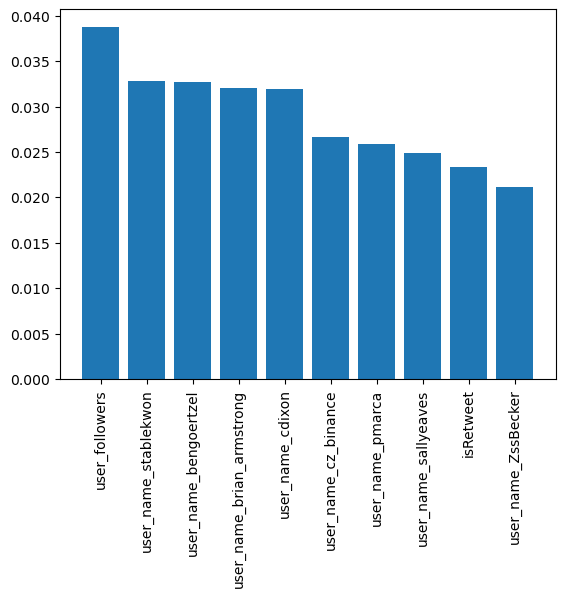

High_direction
                     precision    recall  f1-score   support

High_direction down       0.84      0.96      0.89       750
  High_direction up       0.17      0.04      0.07       148

           accuracy                           0.81       898
          macro avg       0.50      0.50      0.48       898
       weighted avg       0.73      0.81      0.76       898



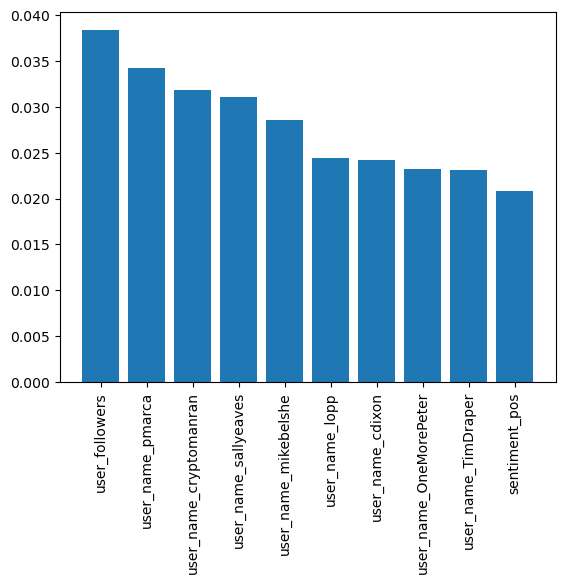

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.83      0.97      0.90       745
  Low_direction up       0.23      0.04      0.07       153

          accuracy                           0.81       898
         macro avg       0.53      0.51      0.48       898
      weighted avg       0.73      0.81      0.76       898



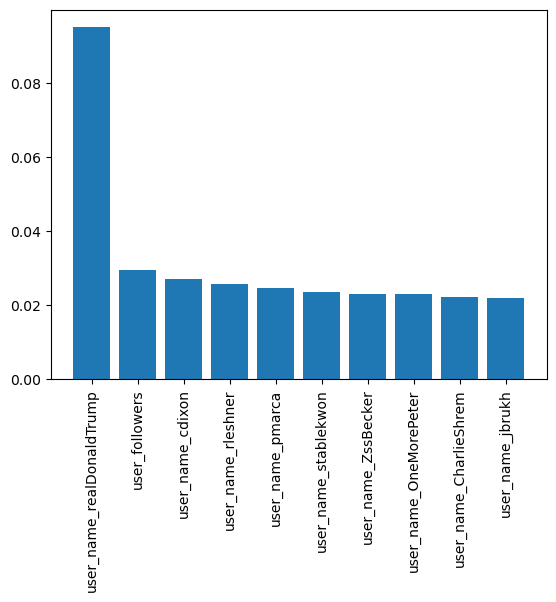

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.82      0.90      0.86       747
  Close_direction up       0.05      0.03      0.03       151

            accuracy                           0.75       898
           macro avg       0.44      0.46      0.45       898
        weighted avg       0.69      0.75      0.72       898



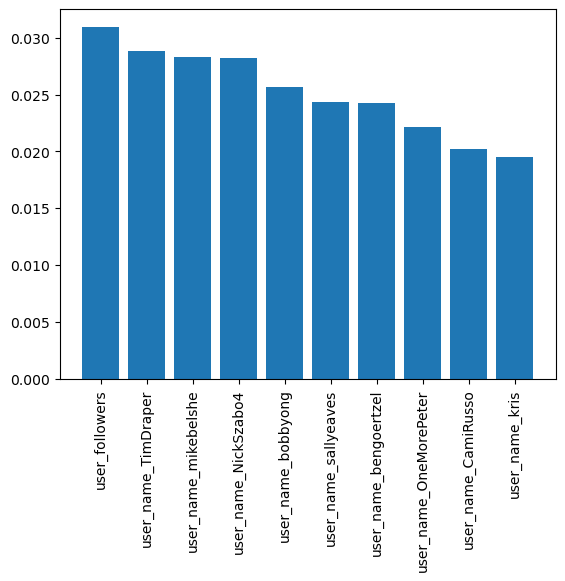

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.84      0.90      0.87       761
  Volume_direction up       0.12      0.07      0.09       137

             accuracy                           0.78       898
            macro avg       0.48      0.49      0.48       898
         weighted avg       0.73      0.78      0.75       898



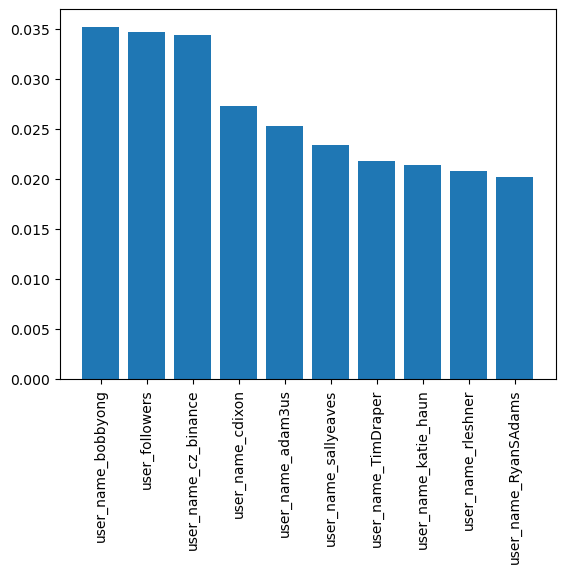

optimisim_gas_all.csv_and_tweets.csv
   Unnamed: 0  ... avg_gas_price_in_wei_direction
0           0  ...                              0
1           1  ...                              0
2           2  ...                              0
3           3  ...                              0
4           4  ...                              0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_in_wei_diff  avg_value_in_wei_direction
0           0 2021-11-11  ...                    NaN                           0
1           1 2021-11-11  ...                    0.0                           0
2           2 2021-11-11  ...                    0.0                           0
3           3 2021-11-11  ...                    0.0                           0
4           4 2021-11-11  ...                    0.0                           0

[5 rows x 96 columns]
train size:  (2736, 90)
validation size:  (547, 90)
test size:  (137, 90)

 random forest
avg_gas_price_in_wei_direction
0.53490552

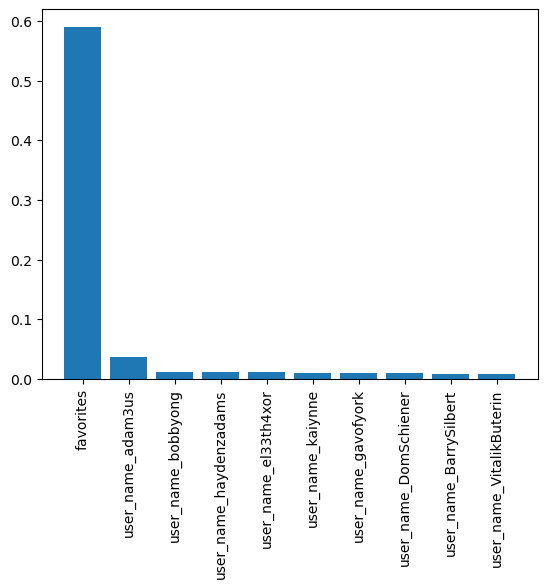

avg_value_in_wei_direction
                                 precision    recall  f1-score   support

avg_value_in_wei_direction down       0.91      0.76      0.83       490
  avg_value_in_wei_direction up       0.14      0.33      0.20        57

                       accuracy                           0.72       547
                      macro avg       0.52      0.55      0.51       547
                   weighted avg       0.83      0.72      0.76       547



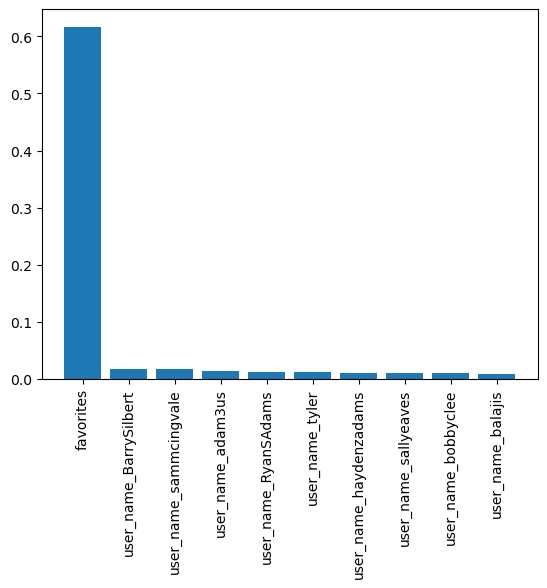

optimism_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
2509        2509  2022-06-01  ...       NaN               0
2508        2508  2022-06-02  ... -0.277482               0
2507        2507  2022-06-03  ...  0.309482               1
2506        2506  2022-06-04  ... -0.183554               0
2505        2505  2022-06-04  ...  0.000000               0

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
2509        2509  2022-06-01  ...       NaN               0
2508        2508  2022-06-02  ... -0.501214               0
2507        2507  2022-06-03  ...  0.045505               1
2506        2506  2022-06-04  ... -0.163991               0
2505        2505  2022-06-04  ...  0.000000               0

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
2509        2509  2022-06-01  ...       NaN              0
2508        2508  2022-06-02  ...  0.007746              1
2507 

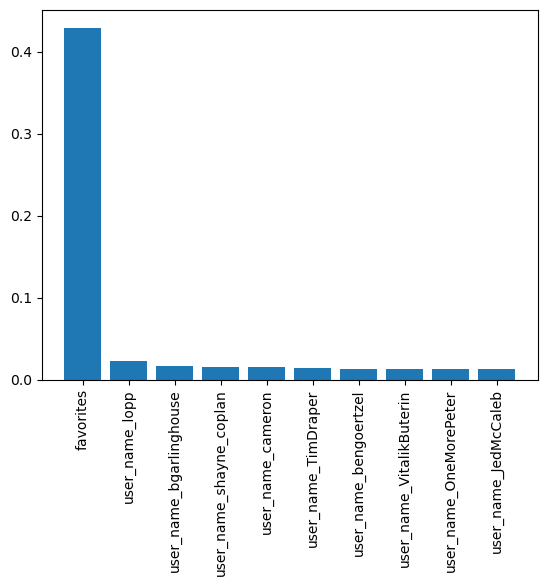

High_direction
                     precision    recall  f1-score   support

High_direction down       0.89      0.88      0.88       360
  High_direction up       0.04      0.05      0.05        41

           accuracy                           0.79       401
          macro avg       0.47      0.46      0.46       401
       weighted avg       0.80      0.79      0.80       401



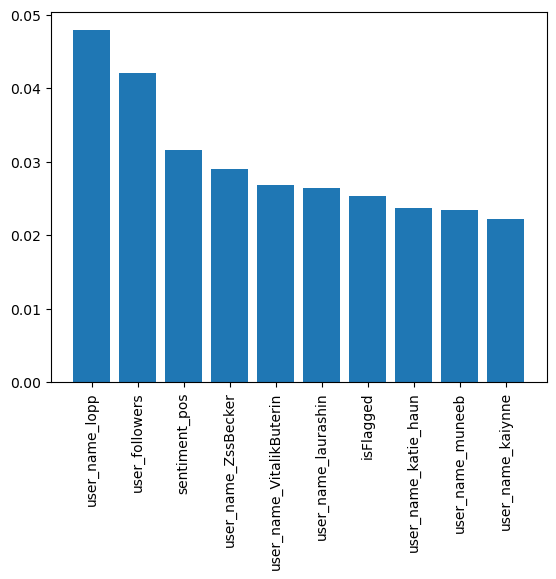

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.89      0.88      0.88       360
  Low_direction up       0.08      0.10      0.09        41

          accuracy                           0.80       401
         macro avg       0.49      0.49      0.49       401
      weighted avg       0.81      0.80      0.80       401



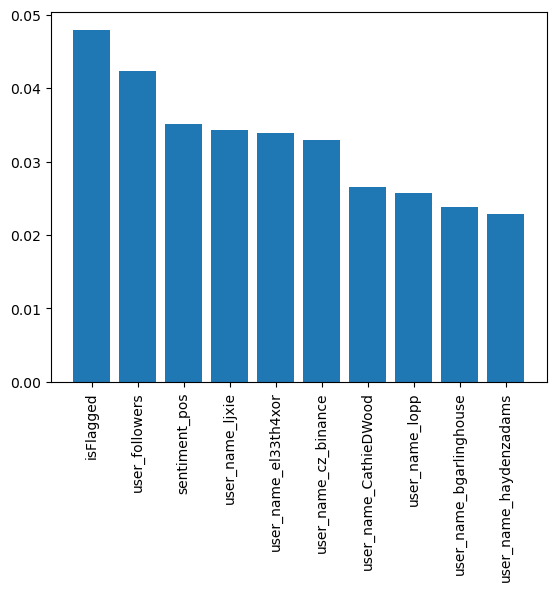

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.91      0.89      0.90       364
  Close_direction up       0.07      0.08      0.07        37

            accuracy                           0.82       401
           macro avg       0.49      0.49      0.49       401
        weighted avg       0.83      0.82      0.82       401



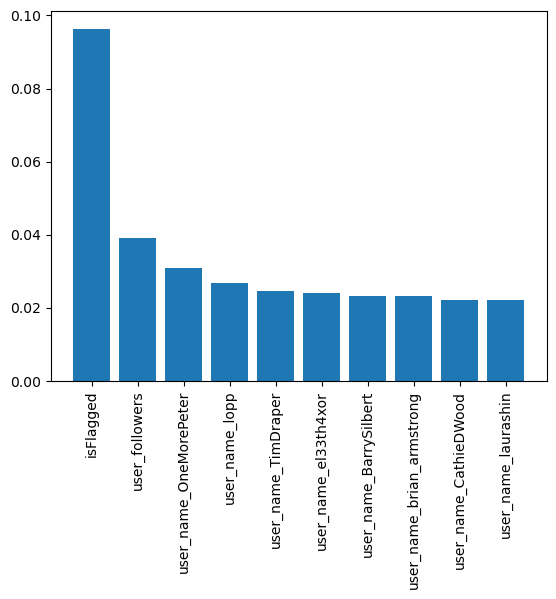

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.90      0.91      0.90       360
  Volume_direction up       0.11      0.10      0.10        41

             accuracy                           0.83       401
            macro avg       0.50      0.50      0.50       401
         weighted avg       0.82      0.83      0.82       401



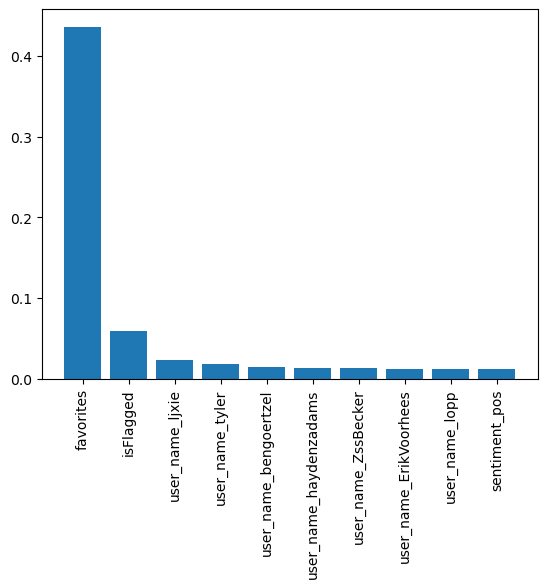

polygon_ecosystem-token_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
1343        1343  2023-10-24  ...       NaN               0
1339        1339  2023-10-25  ...       0.0               0
1342        1342  2023-10-25  ...       0.0               0
1341        1341  2023-10-25  ...       0.0               0
1340        1340  2023-10-25  ...       0.0               0

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
1343        1343  2023-10-24  ...       NaN               0
1339        1339  2023-10-25  ...       0.0               0
1342        1342  2023-10-25  ...       0.0               0
1341        1341  2023-10-25  ...       0.0               0
1340        1340  2023-10-25  ...       0.0               0

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
1343        1343  2023-10-24  ...       NaN              0
1339        1339  2023-10-25  ... -0.022154      

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Close_direction
0.47400000000000003
Volume_direction
0.5492682926829269
Open_direction
                     precision    recall  f1-score   support

Open_direction down       0.93      0.92      0.92       200
  Open_direction up       0.11      0.13      0.12        15

           accuracy                           0.86       215
          macro avg       0.52      0.52      0.52       215
       weighted avg       0.88      0.86      0.87       215



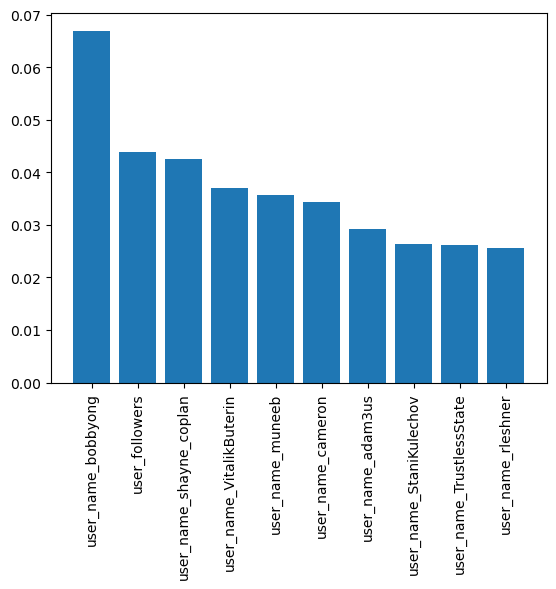

High_direction
                     precision    recall  f1-score   support

High_direction down       0.94      0.90      0.92       204
  High_direction up       0.00      0.00      0.00        11

           accuracy                           0.86       215
          macro avg       0.47      0.45      0.46       215
       weighted avg       0.90      0.86      0.88       215



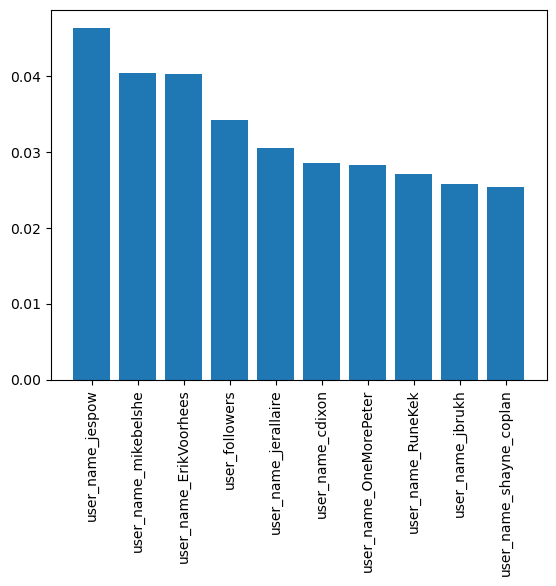

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.93      0.89      0.91       201
  Low_direction up       0.04      0.07      0.05        14

          accuracy                           0.84       215
         macro avg       0.49      0.48      0.48       215
      weighted avg       0.87      0.84      0.86       215



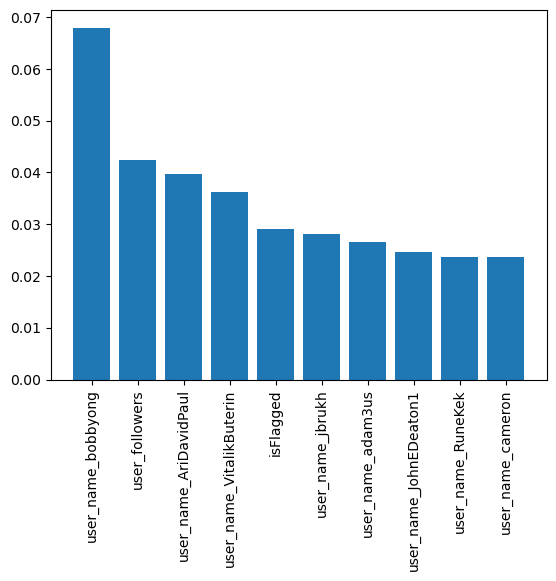

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.93      0.93      0.93       200
  Close_direction up       0.00      0.00      0.00        15

            accuracy                           0.86       215
           macro avg       0.46      0.46      0.46       215
        weighted avg       0.86      0.86      0.86       215



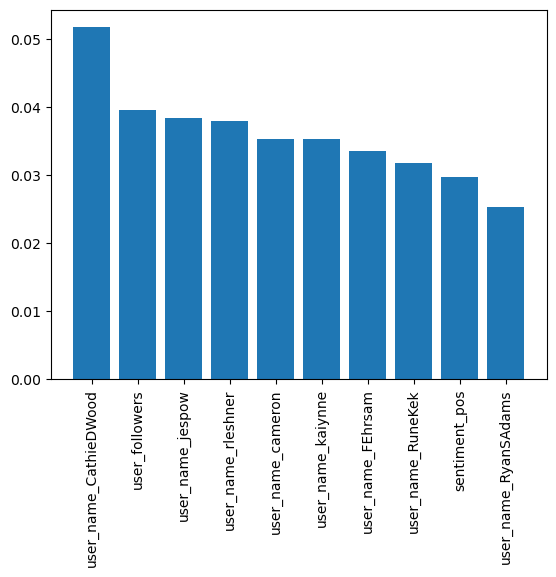

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.95      0.89      0.92       205
  Volume_direction up       0.04      0.10      0.06        10

             accuracy                           0.86       215
            macro avg       0.50      0.50      0.49       215
         weighted avg       0.91      0.86      0.88       215



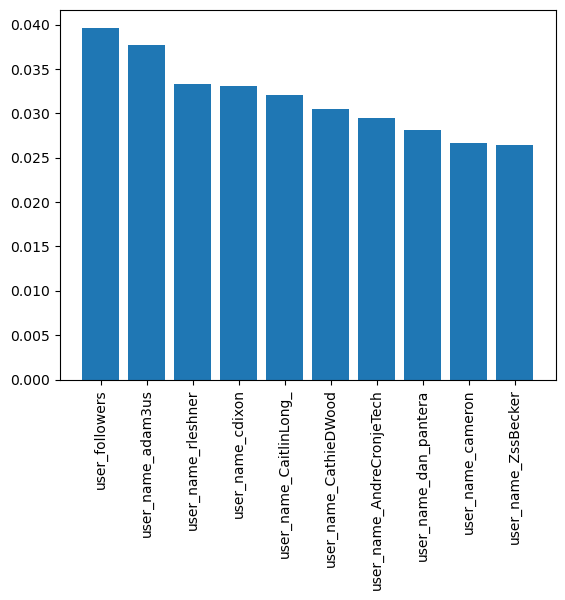

polygon_gas_all.csv_and_tweets.csv
   Unnamed: 0  ... avg_gas_price_in_wei_direction
0           0  ...                              0
1           1  ...                              0
2           2  ...                              0
3           3  ...                              0
4           4  ...                              0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_in_wei_diff  avg_value_in_wei_direction
0           0 2020-05-30  ...                    NaN                           0
1           1 2020-06-12  ...          -3.556250e+17                           0
2           2 2020-06-12  ...           0.000000e+00                           0
3           3 2020-06-12  ...           0.000000e+00                           0
4           4 2020-06-12  ...           0.000000e+00                           0

[5 rows x 96 columns]
train size:  (4241, 90)
validation size:  (848, 90)
test size:  (213, 90)

 random forest
avg_gas_price_in_wei_direction
0.5963155746

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_value_in_wei_direction
0.5627712673611112
avg_gas_price_in_wei_direction
                                     precision    recall  f1-score   support

avg_gas_price_in_wei_direction down       0.84      0.99      0.91       710
  avg_gas_price_in_wei_direction up       0.38      0.04      0.08       138

                           accuracy                           0.83       848
                          macro avg       0.61      0.51      0.49       848
                       weighted avg       0.77      0.83      0.77       848



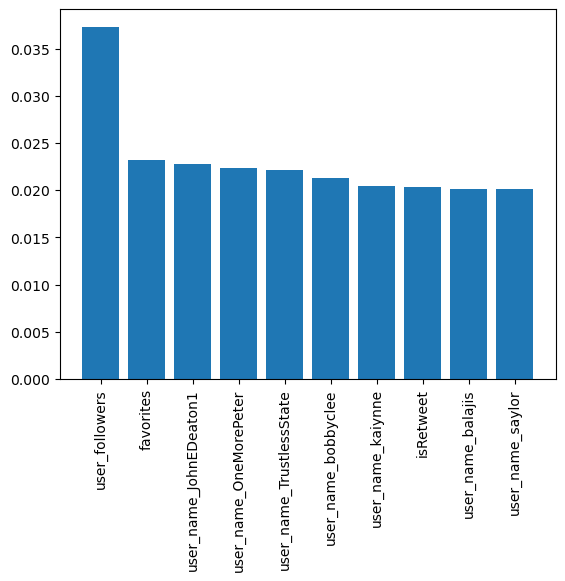

avg_value_in_wei_direction
                                 precision    recall  f1-score   support

avg_value_in_wei_direction down       0.87      0.92      0.89       720
  avg_value_in_wei_direction up       0.34      0.25      0.29       128

                       accuracy                           0.81       848
                      macro avg       0.61      0.58      0.59       848
                   weighted avg       0.79      0.81      0.80       848



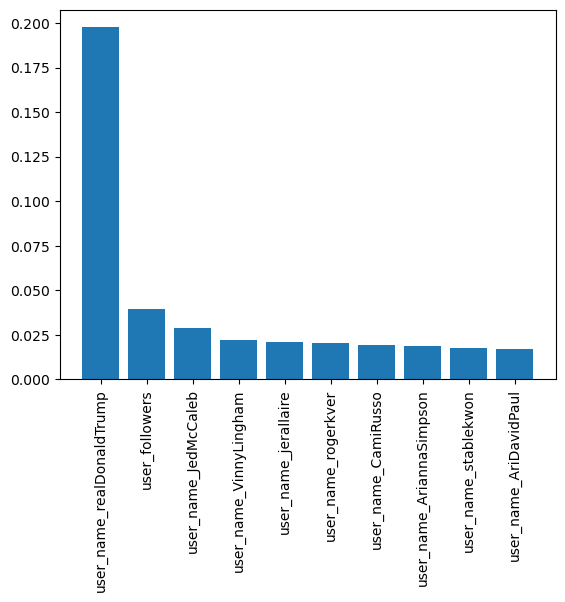

polygon_transac_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_count_diff  avg_count_direction
0           0 2020-05-30  ...             NaN                    0
1           1 2020-05-31  ...       -0.001222                    0
2           2 2020-06-01  ...        0.000000                    0
3           3 2020-06-02  ...        0.000000                    0
4           4 2020-06-02  ...        0.000000                    0

[5 rows x 94 columns]
train size:  (2384, 90)
validation size:  (477, 90)
test size:  (120, 90)

 random forest


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



avg_count_direction
0.5999558693733451

 logistic regression
avg_count_direction
0.4690696225533462
avg_count_direction
                          precision    recall  f1-score   support

avg_count_direction down       0.80      0.93      0.86       374
  avg_count_direction up       0.38      0.16      0.22       103

                accuracy                           0.76       477
               macro avg       0.59      0.54      0.54       477
            weighted avg       0.71      0.76      0.72       477



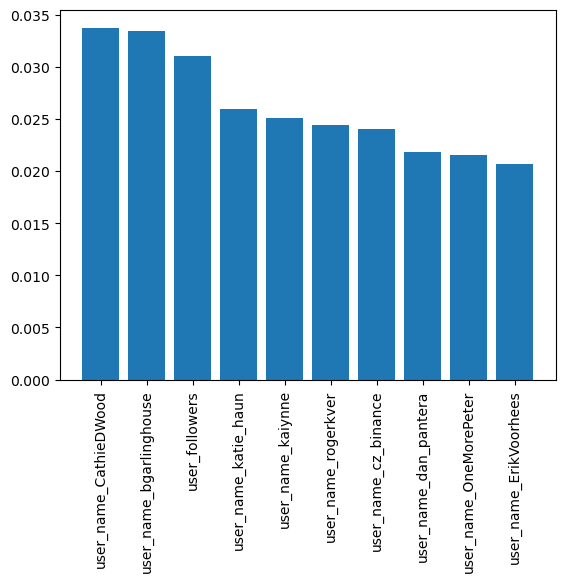

solana_avg_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_fee_diff  avg_fee_direction
0           0 2021-01-02  ...           NaN                  0
1           1 2021-01-03  ...           0.0                  0
2           2 2021-01-03  ...           0.0                  0
3           3 2021-01-03  ...           0.0                  0
4           4 2021-01-03  ...           0.0                  0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_diff  avg_value_direction
0           0 2021-01-02  ...             NaN                    0
1           1 2021-01-03  ...   -3.587813e+07                    0
2           2 2021-01-03  ...    0.000000e+00                    0
3           3 2021-01-03  ...    0.000000e+00                    0
4           4 2021-01-03  ...    0.000000e+00                    0

[5 rows x 96 columns]
train size:  (3912, 90)
validation size:  (783, 90)
test size:  (196, 90)

 random forest
avg_fee_direction
0.5985420463420984
avg_value_dir

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_fee_direction
                        precision    recall  f1-score   support

avg_fee_direction down       0.85      0.98      0.91       668
  avg_fee_direction up       0.11      0.02      0.03       115

              accuracy                           0.84       783
             macro avg       0.48      0.50      0.47       783
          weighted avg       0.74      0.84      0.78       783



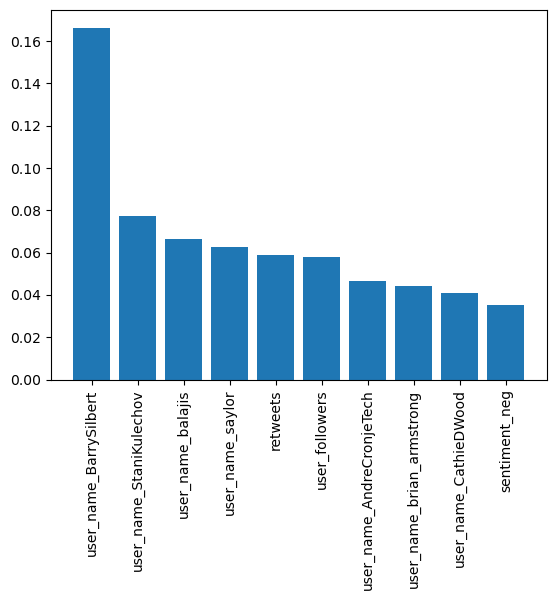

avg_value_direction
                          precision    recall  f1-score   support

avg_value_direction down       0.86      0.95      0.90       675
  avg_value_direction up       0.10      0.04      0.05       108

                accuracy                           0.82       783
               macro avg       0.48      0.49      0.48       783
            weighted avg       0.76      0.82      0.78       783



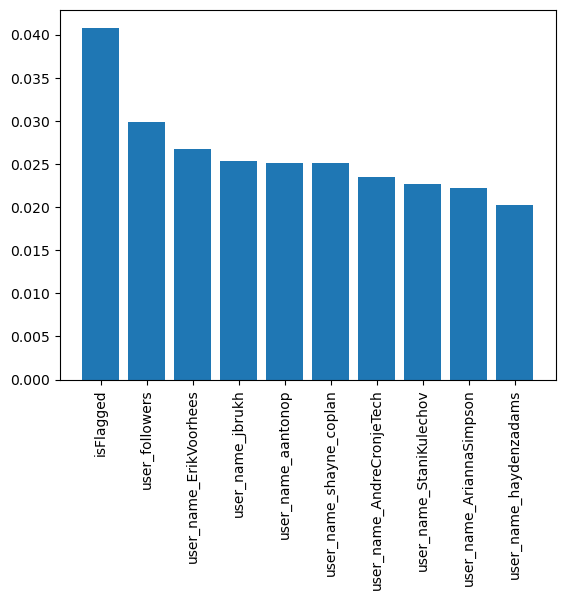

solana_transac_all.csv_and_tweets.csv
   Unnamed: 0       date  ...  avg_count_diff  avg_count_direction
0           0 2021-01-01  ...             NaN                    0
1           1 2021-01-01  ...        0.000000                    0
2           2 2021-01-02  ...        6.204418                    1
8           8 2021-01-03  ...        8.208730                    1
7           7 2021-01-03  ...        0.000000                    0

[5 rows x 93 columns]
train size:  (3914, 89)
validation size:  (783, 89)
test size:  (196, 89)

 random forest


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



avg_count_direction
0.5680940040051832

 logistic regression
avg_count_direction
0.5960242666980798


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_count_direction
                          precision    recall  f1-score   support

avg_count_direction down       0.86      0.91      0.89       653
  avg_count_direction up       0.38      0.27      0.31       130

                accuracy                           0.80       783
               macro avg       0.62      0.59      0.60       783
            weighted avg       0.78      0.80      0.79       783



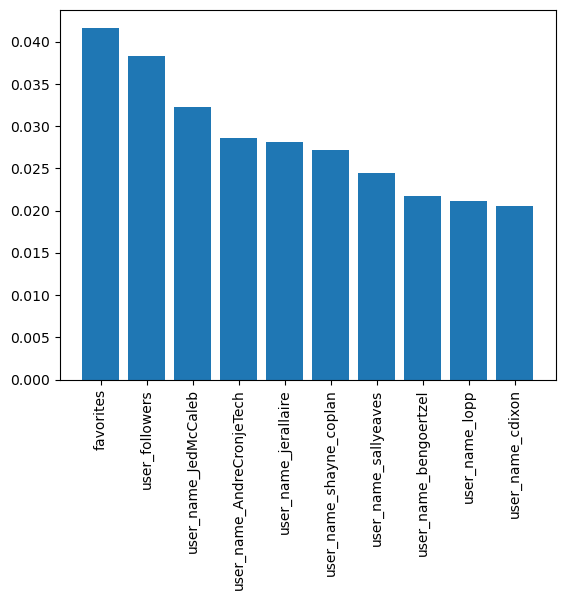

tron_2020-01-01_2024-12-31.csv_and_tweets.csv
      Unnamed: 0       Start  ... Open_diff  Open_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -0.000065               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ... -0.000381               0
5606        5606  2020-01-04  ...  0.000571               1

[5 rows x 100 columns]
      Unnamed: 0       Start  ... High_diff  High_direction
5610        5610  2020-01-01  ...       NaN               0
5609        5609  2020-01-02  ... -0.000165               0
5608        5608  2020-01-02  ...  0.000000               0
5607        5607  2020-01-03  ...  0.000264               1
5606        5606  2020-01-04  ... -0.000007               0

[5 rows x 102 columns]
      Unnamed: 0       Start  ...  Low_diff  Low_direction
5610        5610  2020-01-01  ...       NaN              0
5609        5609  2020-01-02  ... -0.000365              0
5608     

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



High_direction
0.5488458082797705
Low_direction
0.5537120014417131


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Close_direction
0.563452743902439
Volume_direction
0.5387252097635393
Open_direction
                     precision    recall  f1-score   support

Open_direction down       0.83      0.85      0.84       738
  Open_direction up       0.24      0.23      0.23       160

           accuracy                           0.74       898
          macro avg       0.54      0.54      0.54       898
       weighted avg       0.73      0.74      0.73       898



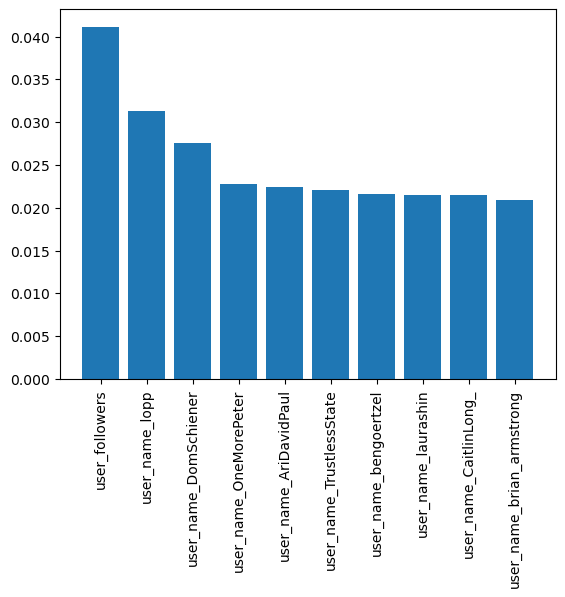

High_direction
                     precision    recall  f1-score   support

High_direction down       0.81      0.88      0.85       742
  High_direction up       0.07      0.04      0.06       156

           accuracy                           0.73       898
          macro avg       0.44      0.46      0.45       898
       weighted avg       0.69      0.73      0.71       898



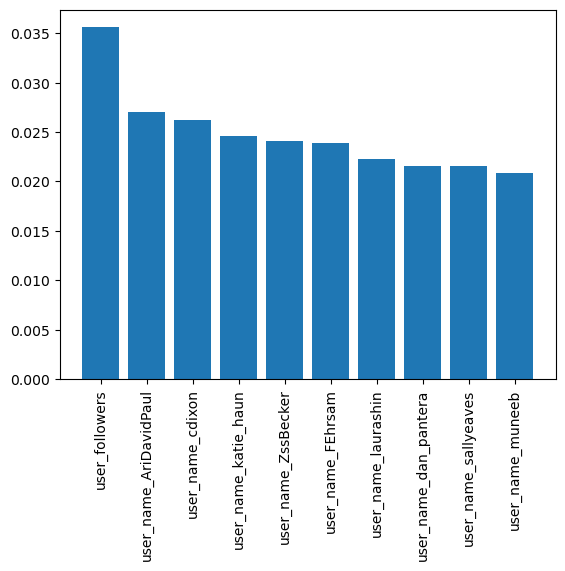

Low_direction
                    precision    recall  f1-score   support

Low_direction down       0.83      0.86      0.84       731
  Low_direction up       0.26      0.22      0.23       167

          accuracy                           0.74       898
         macro avg       0.54      0.54      0.54       898
      weighted avg       0.72      0.74      0.73       898



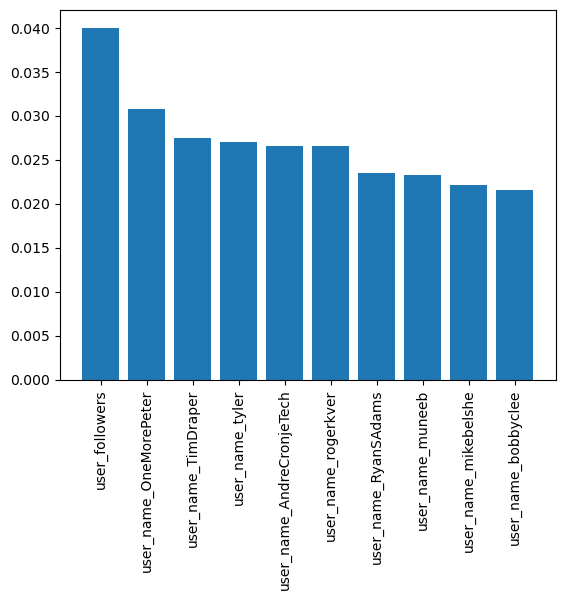

Close_direction
                      precision    recall  f1-score   support

Close_direction down       0.84      0.87      0.85       738
  Close_direction up       0.26      0.21      0.23       160

            accuracy                           0.75       898
           macro avg       0.55      0.54      0.54       898
        weighted avg       0.73      0.75      0.74       898



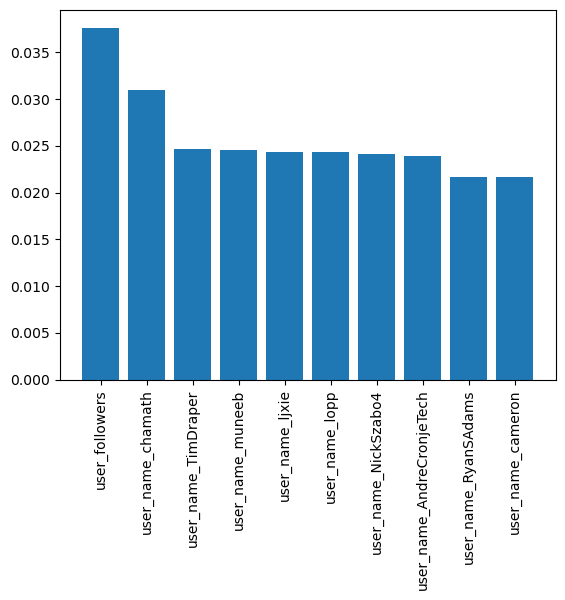

Volume_direction
                       precision    recall  f1-score   support

Volume_direction down       0.84      0.97      0.90       760
  Volume_direction up       0.05      0.01      0.01       138

             accuracy                           0.83       898
            macro avg       0.45      0.49      0.46       898
         weighted avg       0.72      0.83      0.77       898



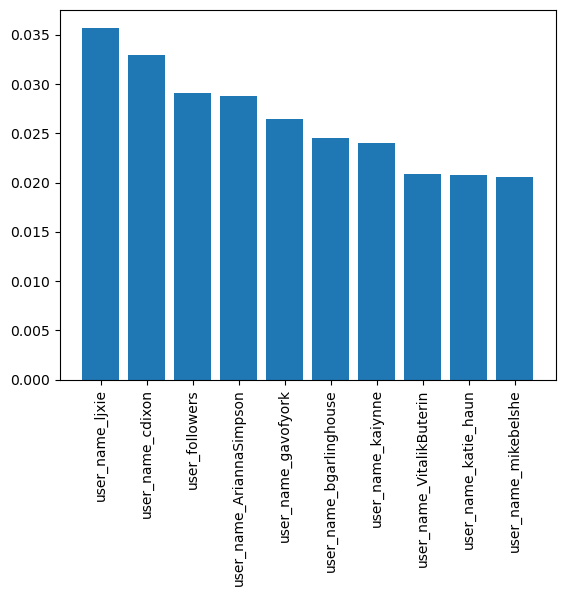

tron_gas_all.csv_and_tweets.csv
   Unnamed: 0  ... avg_gas_price_in_wei_direction
0           0  ...                              0
1           1  ...                              0
2           2  ...                              0
3           3  ...                              0
4           4  ...                              0

[5 rows x 94 columns]
   Unnamed: 0       date  ...  avg_value_in_wei_diff  avg_value_in_wei_direction
0           0 2020-01-01  ...                    NaN                           0
1           1 2020-01-02  ...          -6.245858e+09                           0
2           2 2020-01-02  ...           0.000000e+00                           0
3           3 2020-01-03  ...           9.489261e+09                           1
4           4 2020-01-04  ...           1.432545e+11                           1

[5 rows x 96 columns]
train size:  (4496, 90)
validation size:  (899, 90)
test size:  (225, 90)

 random forest
lack of difference
avg_value_in_wei_direction


c:\Users\qiavo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



avg_value_in_wei_direction
                                 precision    recall  f1-score   support

avg_value_in_wei_direction down       0.85      0.84      0.85       751
  avg_value_in_wei_direction up       0.23      0.24      0.23       148

                       accuracy                           0.74       899
                      macro avg       0.54      0.54      0.54       899
                   weighted avg       0.75      0.74      0.75       899



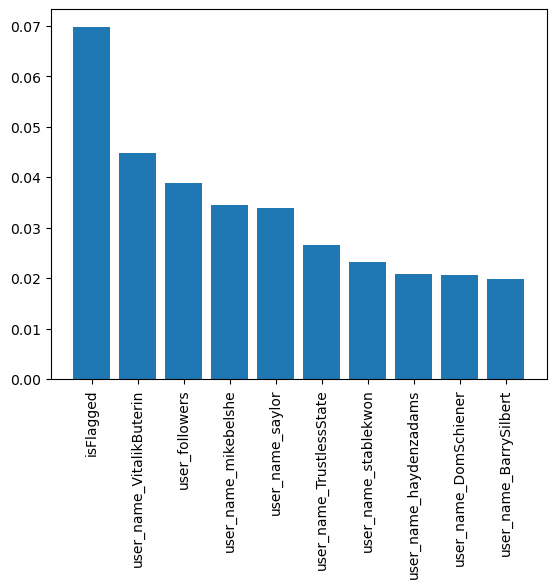

In [32]:
import os

directory = '../datasets/network/merged'
selected_columns = { 'avg' : ['avg_fee', 'avg_value'], 'gas' : ['avg_gas_price_in_wei', 'avg_value_in_wei'], \
                     'transac' : ['avg_count']}

drop_columns = {'avg' : ['date'], 'gas' : ['date'], 'transac' : ['date']}


# have 2 kind of file , csv and parquet
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)

    if os.path.isfile(file_path):

        print(filename)
        #read the files
        df = pd.read_csv(file_path)
        df['date'] = pd.to_datetime(df['date'])
        df.sort_values(by='date', inplace=True)

        #retrieve respective file columns
        cols = selected_columns.get(filename.split('_')[1], ['Open','High','Low','Close','Volume'])
        del_cols = drop_columns.get(filename.split('_')[1], ['Start','End','date', 'Market Cap'])
        del_cols.append('Unnamed: 0')

        #print(df[cols].value_counts())

        y_target = []

        for col in cols:
            df[f'{col}_diff'] = df[f'{col}'].astype(float).diff()
            df[f'{col}_direction'] = (df[f'{col}_diff'] > 0).astype(int) #if current is more than second return as 1 else 0
            print(df.head(5))
            del_cols.append(f'{col}_diff')
            del_cols.append(f'{col}')
            y_target.append(f'{col}_direction')

        df.drop(columns=del_cols, inplace=True)
        #print(df[y_target].value_counts())

        train, val, test = split_train(df, 0.8)

        train_x, train_y = train[[col for col in df.columns if col not in y_target]], train[y_target]
        val_x, val_y = val[[col for col in df.columns if col not in y_target]], val[y_target]

        rnd_clf = RandomForestClassifier(n_estimators=100, random_state=30)
        log_mod = LogisticRegression(random_state=50, max_iter=100)
        reg = LinearRegression()
        xgb = XGBRegressor(n_estimators=100)
        print("\n random forest")
        binary_outcomes_model(train_x, train_y, val_x, val_y, rnd_clf, y_target)
        log_model(train_x, train_y, val_x, val_y, log_mod, y_target)
        #binary_outcomes_model(train_x, train_y, val_x, val_y, reg, y_target)
        xgb_getfeaturesimpt(train_x, train_y, val_x, val_y, xgb, y_target)


In [33]:
def split_sequentially2(df, num_of_y):
    '''
    Purpose: split data sequentially
    Input: df -> dataframe of data for ml
           num_of_y -> number of y variables to predict (will be sliced from 0 to num_of_y)
           -> with assumption that y variables is at the front
    Output:
        x -> past data used to predict
        y -> future data

    '''
    x, y = [], []
    for i in range(len(df)-TIME_STEP-1):
        x.append(df[i:(i+TIME_STEP), :]) #take every variables in the past to predict the 2 variables in future
        y.append(df[i + TIME_STEP, :])
    print(len(x), len(y))
    return np.array(x), np.array(y)

def train_sentiment_lstm2(x_train, y_train,  x_val, y_val, epochs, batch_size):
    print(x_train.shape[2], x_train.shape)
    input1 = Input(shape=(TIME_STEP, x_train.shape[2]))
    x1 = LSTM(units=10, activation="sigmoid", return_sequences=False)(input1) #tanh not good
    x1 = Dropout(0.05)(x1)
    #x1 = Bidirectional(LSTM(units=10, return_sequences=False))(x1)

    # Output layers
    output1 = Dense(units=NUM_OF_Y, activation='softmax', name='output1')(x1)
    #the model
    model = Model(inputs=input1, outputs={'output1': output1})

    # Compile the model
    model.compile(loss={'output1': 'mean_squared_error'},
                  optimizer='adam',
                  metrics={'output1': ['accuracy'] })
    print(model.summary())

    # Fit the model
    history = model.fit(x_train, {'output1': y_train }, validation_data=(x_val, y_val), epochs=epochs, batch_size=batch_size, verbose=1)

    return model


In [ ]:
import os

directories = ['../datasets/network/network_data', '../datasets/network/prices']
selected_columns = { 'avg' : ['avg_fee', 'avg_value'], 'gas' : ['avg_gas_price_in_wei', 'avg_value_in_wei'], \
                     'transac' : ['avg_count']}

drop_columns = {'avg' : ['date'], 'gas' : ['date'], 'transac' : ['date']}

for directory in directories:
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)

        if os.path.isfile(file_path):

            print(filename)
            #read the files
            df = pd.read_csv(file_path)
            if directory == '../datasets/network/prices':
                df['Start'] = pd.to_datetime(df['Start'])
                df.sort_values(by='Start', inplace=True)
            else:
                df['date'] = pd.to_datetime(df['date'])
                df.sort_values(by='date', inplace=True)
            file_name_splitted = filename.split('_')
            #retrieve respective file columns
            cols = selected_columns.get(file_name_splitted[1], ['Open','High','Low','Close','Volume'])
            del_cols = drop_columns.get(file_name_splitted[1], ['End', 'Market Cap'])
            if 'Unnamed: 0' in df.columns:
                del_cols.append('Unnamed: 0')

            df_dates = df.Start if directory == '../datasets/network/prices' else df.date
            df.drop(columns=del_cols, inplace=True)

            #LSTM model parameters
            TIME_STEP = 5
            EPOCHS = 10
            BATCH_SIZE = 32
            NUM_OF_Y = len(cols)

            train, val, test = split_train(df[cols], 0.8)

            scaler_x = MinMaxScaler()

            train = scaler_x.fit_transform(train)
            val = scaler_x.transform(val)
            test = scaler_x.transform(test)

            x_train, y_train = split_sequentially2(train, NUM_OF_Y)
            x_val, y_val = split_sequentially2(val, NUM_OF_Y)
            x_test, y_test = split_sequentially2(test, NUM_OF_Y)
            #x_train, y_train, train

            model = train_sentiment_lstm2(x_train, y_train,  x_val, y_val, EPOCHS, BATCH_SIZE)
            #get_pred(x_test, y_test, model, scaler_y)

            predictions = np.array([])
            with_pred = test
            #predict for next 20 days
            for i in range(20):
                x_test = np.array(with_pred[-TIME_STEP:]).reshape(-1, TIME_STEP, df.shape[1])
                pred = model.predict(x_test)['output1']
                predictions = np.append(predictions, pred)

                # append the predicted values to the current data for the next prediction
                with_pred = np.append(with_pred, pred, axis=0)
            with_pred = with_pred[:,:NUM_OF_Y]

            #cols.append('date')
            forecasted = pd.concat([df[cols], df_dates], axis=1)

            start_date = pd.to_datetime(df_dates.iloc[-1]) + timedelta(days=1) #get the last date + 1 day (for forecast)
            date_range = [start_date.date() + timedelta(days=i) for i in range(20)] #generate following 20days dates

            predictions = scaler_x.inverse_transform(predictions.reshape(-1,NUM_OF_Y)) #convert back

            plot_df = pd.DataFrame({'date': date_range})
            pred_df = pd.DataFrame(predictions, columns = cols)
            pred_df = pd.concat([plot_df , pred_df], axis=1)

            forecasted = pd.concat([forecasted, pred_df])
            forecasted['date'] = pd.to_datetime(forecasted['date'])

            network = file_name_splitted[0]

            if 'Open' not in cols:
                for y in range(0,NUM_OF_Y):
                    plot_line_graph(forecasted, y, network, cols, df_dates)
            else :
                fig = go.Figure()
                fig.add_trace(go.Candlestick(x=forecasted.date,
                                open=forecasted['Open'],
                                high=forecasted['High'],
                                low=forecasted['Low'],
                                close=forecasted['Close'])
                             )
                fig.add_shape(
                    type="line",
                    x0=start_date,
                    x1=start_date,
                    y0=0,
                    y1=forecasted.tail(10).Open.max() + 10,
                    line=dict(
                        color="red",
                        width=1,
                        dash="dash",  # 'dash' is Plotly's equivalent of '--'
                    )
                )

                fig.update_layout(xaxis_rangeslider_visible=False,
                                 title = f'{network} prices over time',
                                 xaxis_title="Date (drag to chose specific time frame)"
                                 )
                fig.show()
                plot_line_graph(forecasted, 0, network, ['Volume'], df_dates)


arbitrum_gas_all.csv
train size:  (1050, 2)
validation size:  (210, 2)
test size:  (53, 2)
1044 1044
204 204
47 47
2 (1044, 5, 2)


Model: "functional_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_87 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_87 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_87 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.6904 - loss: 0.2990 - val_accuracy: 0.2157 - val_loss: 0.2719
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6814 - loss: 0.2665 - val_accuracy: 0.2157 - val_loss: 0.2540
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6906 - loss: 0.2533 - val_accuracy: 0.2157 - val_loss: 0.2502
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6261 - loss: 0.2509 - val_accuracy: 0.2157 - val_loss: 0.2500
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5929 - loss: 0.2511 - val_accuracy: 0.2157 - val_loss: 0.2500
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5827 - loss: 0.2508 - val_accuracy: 0.2157 - val_loss: 0.2500
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6189 - loss: 0.2506 - val_accuracy: 0.2157 - val_loss: 0.2500
Epoch 8/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5901 - loss: 0.2510 - val_accuracy: 0.2157 - val

Model: "functional_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_88 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_88 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_88 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.3851 - loss: 0.1841 - val_accuracy: 1.0000 - val_loss: 0.1919
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7646 - loss: 0.1819 - val_accuracy: 1.0000 - val_loss: 0.1923
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7716 - loss: 0.1798 - val_accuracy: 1.0000 - val_loss: 0.1920
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7755 - loss: 0.1804 - val_accuracy: 1.0000 - val_loss: 0.1920
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7888 - loss: 0.1821 - val_accuracy: 1.0000 - val_loss: 0.1922
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7756 - loss: 0.1824 - val_accuracy: 1.0000 - val_loss: 0.1917
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7852 - loss: 0.1792 - val_accuracy: 1.0000 - val_loss: 0.1919
Epoch 8/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7820 - loss: 0.1809 - val_accuracy: 1.0000 - va

Model: "functional_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_89 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_89 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_89 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.5956 - loss: 0.1952 - val_accuracy: 0.3776 - val_loss: 0.2202
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5606 - loss: 0.1716 - val_accuracy: 0.3776 - val_loss: 0.2127
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5588 - loss: 0.1717 - val_accuracy: 0.3776 - val_loss: 0.2126
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5507 - loss: 0.1708 - val_accuracy: 0.3881 - val_loss: 0.2120
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5518 - loss: 0.1701 - val_accuracy: 0.4126 - val_loss: 0.2118
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5537 - loss: 0.1689 - val_accuracy: 0.4406 - val_loss: 0.2117
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5807 - loss: 0.1688 - val_accuracy: 0.4825 - val_loss: 0.2112
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5935 - loss: 0.1682 - val_accuracy: 0.5559 - val

Model: "functional_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_90 (InputLayer)     │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_90 (LSTM)                  │ (None, 10)             │           480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_90 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 491 (1.92 KB)

 Trainable params: 491 (1.92 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.0000e+00 - loss: 0.5073 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0000e+00 - loss: 0.5108 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0000e+00 - loss: 0.4999 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.5104 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0000e+00 - loss: 0.5094 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0000e+00 - loss: 0.5052 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00 - loss: 0.4954 - val_accuracy: 0.0000e+00 - val_loss: 0.1400
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0000e+00

Model: "functional_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_91 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_91 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_91 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.8871 - loss: 0.2697 - val_accuracy: 0.9551 - val_loss: 0.2316
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9097 - loss: 0.2411 - val_accuracy: 0.9551 - val_loss: 0.2132
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8751 - loss: 0.2239 - val_accuracy: 0.9551 - val_loss: 0.2071
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8007 - loss: 0.2193 - val_accuracy: 0.9551 - val_loss: 0.2063
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7585 - loss: 0.2179 - val_accuracy: 0.9551 - val_loss: 0.2063
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7730 - loss: 0.2188 - val_accuracy: 0.9551 - val_loss: 0.2064
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7575 - loss: 0.2177 - val_accuracy: 0.9494 - val_loss: 0.2064
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7394 - loss: 0.2176 - val_accuracy: 0.9551 - val

Model: "functional_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_92 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_92 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_92 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.4963 - loss: 0.1640 - val_accuracy: 0.9704 - val_loss: 0.2234
Epoch 2/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5297 - loss: 0.1613 - val_accuracy: 0.9704 - val_loss: 0.2232
Epoch 3/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4970 - loss: 0.1594 - val_accuracy: 0.9704 - val_loss: 0.2233
Epoch 4/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4955 - loss: 0.1610 - val_accuracy: 0.9704 - val_loss: 0.2232
Epoch 5/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4951 - loss: 0.1597 - val_accuracy: 0.9704 - val_loss: 0.2232
Epoch 6/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4970 - loss: 0.1596 - val_accuracy: 0.9704 - val_loss: 0.2232
Epoch 7/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4729 - loss: 0.1587 - val_accuracy: 0.9704 - val_loss: 0.2232
Epoch 8/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5379 - loss: 0.1602 - val_accuracy: 0.9704 - val

Model: "functional_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_93 (InputLayer)     │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_93 (LSTM)                  │ (None, 10)             │           480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_93 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 491 (1.92 KB)

 Trainable params: 491 (1.92 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



43/43 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 4.5383e-04 - loss: 0.9690 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 2/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0014 - loss: 0.9626 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 3/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 3.9583e-04 - loss: 0.9634 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 4/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 9.6123e-04 - loss: 0.9623 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 5/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 3.6851e-04 - loss: 0.9666 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 6/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0016 - loss: 0.9594 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 7/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0016 - loss: 0.9653 - val_accuracy: 0.0000e+00 - val_loss: 0.6248
Epoch 8/10
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0020 - loss: 0.9631 

Model: "functional_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_94 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_94 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_94 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7860 - loss: 0.1881 - val_accuracy: 0.9545 - val_loss: 0.2160
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7417 - loss: 0.1675 - val_accuracy: 0.9545 - val_loss: 0.2119
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6862 - loss: 0.1654 - val_accuracy: 0.9545 - val_loss: 0.2118
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6425 - loss: 0.1637 - val_accuracy: 0.9545 - val_loss: 0.2119
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6943 - loss: 0.1651 - val_accuracy: 0.9545 - val_loss: 0.2119
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7072 - loss: 0.1638 - val_accuracy: 0.9545 - val_loss: 0.2119
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6814 - loss: 0.1642 - val_accuracy: 0.9545 - val_loss: 0.2119
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6830 - loss: 0.1642 - val_accuracy: 0.9545 - va

Model: "functional_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_95 (InputLayer)     │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_95 (LSTM)                  │ (None, 10)             │           480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_95 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 491 (1.92 KB)

 Trainable params: 491 (1.92 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.0017 - loss: 0.2846 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.7578e-04 - loss: 0.2791 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0023 - loss: 0.2856 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 3.1734e-04 - loss: 0.2854 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.9425e-04 - loss: 0.2825 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0014 - loss: 0.2777 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 2.1325e-04 - loss: 0.2828 - val_accuracy: 0.0000e+00 - val_loss: 0.2824
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 2.9246e-05 - loss: 0.2

Model: "functional_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_96 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_96 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_96 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3099 - loss: 0.3022 - val_accuracy: 0.0000e+00 - val_loss: 0.2772
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2923 - loss: 0.2597 - val_accuracy: 0.0000e+00 - val_loss: 0.2530
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3099 - loss: 0.2391 - val_accuracy: 0.0000e+00 - val_loss: 0.2458
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3369 - loss: 0.2358 - val_accuracy: 0.0804 - val_loss: 0.2449
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5103 - loss: 0.2334 - val_accuracy: 1.0000 - val_loss: 0.2449
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6567 - loss: 0.2345 - val_accuracy: 1.0000 - val_loss: 0.2449
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6362 - loss: 0.2332 - val_accuracy: 1.0000 - val_loss: 0.2449
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6550 - loss: 0.2334 - val_accuracy: 

Model: "functional_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_97 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_97 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_97 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.6820 - loss: 0.1998 - val_accuracy: 0.2528 - val_loss: 0.1903
Epoch 2/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6292 - loss: 0.1914 - val_accuracy: 0.2584 - val_loss: 0.1886
Epoch 3/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6392 - loss: 0.1917 - val_accuracy: 0.2528 - val_loss: 0.1892
Epoch 4/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6419 - loss: 0.1925 - val_accuracy: 0.2528 - val_loss: 0.1892
Epoch 5/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6420 - loss: 0.1912 - val_accuracy: 0.2528 - val_loss: 0.1891
Epoch 6/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6328 - loss: 0.1893 - val_accuracy: 0.2584 - val_loss: 0.1889
Epoch 7/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.6106 - loss: 0.1897 - val_accuracy: 0.2584 - val_loss: 0.1889
Epoch 8/10
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5982 - loss: 0.1897 - val_accuracy: 0.2584 - val

Model: "functional_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_98 (InputLayer)     │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_98 (LSTM)                  │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_98 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.3395 - loss: 0.2253 - val_accuracy: 0.2548 - val_loss: 0.2085
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4383 - loss: 0.2065 - val_accuracy: 0.7452 - val_loss: 0.2063
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6201 - loss: 0.2045 - val_accuracy: 0.7452 - val_loss: 0.2063
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7163 - loss: 0.2060 - val_accuracy: 0.7452 - val_loss: 0.2063
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5816 - loss: 0.2061 - val_accuracy: 0.7452 - val_loss: 0.2063
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6542 - loss: 0.2057 - val_accuracy: 0.7452 - val_loss: 0.2063
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6786 - loss: 0.2054 - val_accuracy: 0.7529 - val_loss: 0.2063
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7289 - loss: 0.2065 - val_accuracy: 0.8031 - val

Model: "functional_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_99 (InputLayer)     │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_99 (LSTM)                  │ (None, 10)             │           480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_99 (Dropout)            │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 491 (1.92 KB)

 Trainable params: 491 (1.92 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 3.8704e-04 - loss: 0.7425 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 2/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0022 - loss: 0.7397 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 3/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 5.3851e-04 - loss: 0.7393 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 4/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0041 - loss: 0.7353 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 5/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 6.8199e-05 - loss: 0.7436 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 6/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0011 - loss: 0.7386 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 7/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 1.3896e-04 - loss: 0.7462 - val_accuracy: 0.0000e+00 - val_loss: 0.5543
Epoch 8/10
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 5.9451e-04 - loss: 0.7

Model: "functional_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_100 (InputLayer)    │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_100 (LSTM)                 │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_100 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.0186 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 2/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.0051 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 3/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0041 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 4/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0011 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 5/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.0037 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 6/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0016 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 7/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.0021 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 8/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 9.1176e-04 - loss: nan - val_accuracy: 0.0132 - val_loss: nan
Epoch 9/10
37/37 ━━━━━━━━━━━

Model: "functional_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_101 (InputLayer)    │ (None, 5, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_101 (LSTM)                 │ (None, 10)             │           480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_101 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 491 (1.92 KB)

 Trainable params: 491 (1.92 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10


c:\Users\qiavo\anaconda3\lib\site-packages\keras\src\ops\nn.py:545: UserWarning:

You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?



37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 9.9491e-04 - loss: 0.2730 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 2/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 8.6312e-04 - loss: 0.2794 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 3/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 3.4024e-04 - loss: 0.2657 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 4/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 2.7815e-04 - loss: 0.2788 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 5/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 1.6648e-04 - loss: 0.2799 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 6/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 1.1586e-04 - loss: 0.2852 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 7/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 9.9491e-04 - loss: 0.2665 - val_accuracy: 0.0000e+00 - val_loss: 0.3317
Epoch 8/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 2.7815e-04

Model: "functional_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_102 (InputLayer)    │ (None, 5, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_102 (LSTM)                 │ (None, 10)             │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_102 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 2)              │            22 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 542 (2.12 KB)

 Trainable params: 542 (2.12 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7879 - loss: 0.1301 - val_accuracy: 1.0000 - val_loss: 0.0529
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7966 - loss: 0.1255 - val_accuracy: 1.0000 - val_loss: 0.0517
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7714 - loss: 0.1315 - val_accuracy: 1.0000 - val_loss: 0.0483
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7731 - loss: 0.1247 - val_accuracy: 1.0000 - val_loss: 0.0455
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7765 - loss: 0.1216 - val_accuracy: 1.0000 - val_loss: 0.0428
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7609 - loss: 0.1212 - val_accuracy: 1.0000 - val_loss: 0.0374
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7861 - loss: 0.1117 - val_accuracy: 1.0000 - val_loss: 0.0357
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7777 - loss: 0.1108 - val_accuracy: 1.0000 - val

Model: "functional_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_103 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_103 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_103 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.0000e+00 - loss: 0.0596 - val_accuracy: 0.0000e+00 - val_loss: 0.0282
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.0015 - loss: 0.0553 - val_accuracy: 0.0000e+00 - val_loss: 0.0269
Epoch 3/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0608 - loss: 0.0498 - val_accuracy: 0.6837 - val_loss: 0.0261
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7547 - loss: 0.0431 - val_accuracy: 0.6837 - val_loss: 0.0259
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8411 - loss: 0.0385 - val_accuracy: 0.6837 - val_loss: 0.0264
Epoch 6/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8296 - loss: 0.0306 - val_accuracy: 0.6837 - val_loss: 0.0272
Epoch 7/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8427 - loss: 0.0287 - val_accuracy: 0.6837 - val_loss: 0.0283
Epoch 8/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7998 - loss: 0.0267 - val_accuracy: 

Model: "functional_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_104 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_104 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_104 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4414 - loss: 0.0446 - val_accuracy: 0.6311 - val_loss: 0.0103
Epoch 2/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3477 - loss: 0.0412 - val_accuracy: 0.6189 - val_loss: 0.0091
Epoch 3/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3584 - loss: 0.0418 - val_accuracy: 0.5861 - val_loss: 0.0087
Epoch 4/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3217 - loss: 0.0397 - val_accuracy: 0.5984 - val_loss: 0.0086
Epoch 5/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2566 - loss: 0.0399 - val_accuracy: 0.6475 - val_loss: 0.0086
Epoch 6/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2387 - loss: 0.0365 - val_accuracy: 0.6230 - val_loss: 0.0086
Epoch 7/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2056 - loss: 0.0410 - val_accuracy: 0.6311 - val_loss: 0.0086
Epoch 8/10
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2241 - loss: 0.0377 - val_accuracy: 0.5164 - val

Model: "functional_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_105 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_105 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_105 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2839 - loss: 0.0714 - val_accuracy: 0.8601 - val_loss: 0.2573
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5056 - loss: 0.0634 - val_accuracy: 0.8986 - val_loss: 0.2522
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5148 - loss: 0.0647 - val_accuracy: 0.8986 - val_loss: 0.2489
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5258 - loss: 0.0648 - val_accuracy: 0.8986 - val_loss: 0.2473
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5275 - loss: 0.0587 - val_accuracy: 0.8986 - val_loss: 0.2465
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5790 - loss: 0.0636 - val_accuracy: 0.8986 - val_loss: 0.2459
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5882 - loss: 0.0647 - val_accuracy: 0.8986 - val_loss: 0.2456
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6293 - loss: 0.0648 - val_accuracy: 0.8986 - val

Model: "functional_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_106 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_106 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_106 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.2159 - loss: 0.0973 - val_accuracy: 0.0070 - val_loss: 0.4157
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2613 - loss: 0.0823 - val_accuracy: 0.3462 - val_loss: 0.4011
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3805 - loss: 0.0783 - val_accuracy: 0.3462 - val_loss: 0.3949
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3381 - loss: 0.0788 - val_accuracy: 0.3462 - val_loss: 0.3914
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2464 - loss: 0.0790 - val_accuracy: 0.3462 - val_loss: 0.3894
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2178 - loss: 0.0769 - val_accuracy: 0.3462 - val_loss: 0.3880
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1827 - loss: 0.0730 - val_accuracy: 0.3462 - val_loss: 0.3871
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2005 - loss: 0.0709 - val_accuracy: 0.3462 - val

Model: "functional_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_107 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_107 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_107 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.0703 - loss: 0.0308 - val_accuracy: 0.0385 - val_loss: 0.0179
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.0852 - loss: 0.0264 - val_accuracy: 0.6783 - val_loss: 0.0175
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5150 - loss: 0.0290 - val_accuracy: 0.9266 - val_loss: 0.0175
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6346 - loss: 0.0284 - val_accuracy: 0.9266 - val_loss: 0.0175
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6179 - loss: 0.0274 - val_accuracy: 0.9266 - val_loss: 0.0175
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6432 - loss: 0.0282 - val_accuracy: 0.9266 - val_loss: 0.0175
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6213 - loss: 0.0268 - val_accuracy: 0.9266 - val_loss: 0.0175
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6556 - loss: 0.0268 - val_accuracy: 0.9266 - val

Model: "functional_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_108 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_108 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_108 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.8051 - loss: 0.0288 - val_accuracy: 0.2762 - val_loss: 0.0992
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6333 - loss: 0.0270 - val_accuracy: 0.2028 - val_loss: 0.1030
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5471 - loss: 0.0239 - val_accuracy: 0.2308 - val_loss: 0.1062
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5858 - loss: 0.0247 - val_accuracy: 0.2483 - val_loss: 0.1076
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5747 - loss: 0.0246 - val_accuracy: 0.2657 - val_loss: 0.1082
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5902 - loss: 0.0240 - val_accuracy: 0.2727 - val_loss: 0.1082
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5900 - loss: 0.0247 - val_accuracy: 0.2832 - val_loss: 0.1081
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5777 - loss: 0.0238 - val_accuracy: 0.2692 - val

Model: "functional_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_109 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_109 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_109 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.1690 - loss: 0.0699 - val_accuracy: 0.2517 - val_loss: 0.1442
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1488 - loss: 0.0619 - val_accuracy: 0.2552 - val_loss: 0.1388
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1330 - loss: 0.0630 - val_accuracy: 0.2308 - val_loss: 0.1359
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1193 - loss: 0.0591 - val_accuracy: 0.2552 - val_loss: 0.1344
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1473 - loss: 0.0576 - val_accuracy: 0.2448 - val_loss: 0.1336
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1660 - loss: 0.0617 - val_accuracy: 0.2622 - val_loss: 0.1332
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1441 - loss: 0.0626 - val_accuracy: 0.2552 - val_loss: 0.1330
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1711 - loss: 0.0593 - val_accuracy: 0.2552 - val

Model: "functional_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_110 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_110 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_110 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.1216 - loss: 0.0438 - val_accuracy: 0.1154 - val_loss: 0.0060
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1595 - loss: 0.0398 - val_accuracy: 0.3217 - val_loss: 0.0053
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1555 - loss: 0.0385 - val_accuracy: 0.6049 - val_loss: 0.0054
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2199 - loss: 0.0420 - val_accuracy: 0.7378 - val_loss: 0.0053
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2348 - loss: 0.0386 - val_accuracy: 0.7378 - val_loss: 0.0053
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2293 - loss: 0.0392 - val_accuracy: 0.6189 - val_loss: 0.0054
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2442 - loss: 0.0391 - val_accuracy: 0.6923 - val_loss: 0.0053
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2399 - loss: 0.0400 - val_accuracy: 0.7168 - val

Model: "functional_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_111 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_111 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_111 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.1462 - loss: 0.0569 - val_accuracy: 0.1448 - val_loss: 0.0075
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1577 - loss: 0.0585 - val_accuracy: 0.1448 - val_loss: 0.0056
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2034 - loss: 0.0498 - val_accuracy: 0.1448 - val_loss: 0.0048
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.2314 - loss: 0.0511 - val_accuracy: 0.5103 - val_loss: 0.0044
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3668 - loss: 0.0547 - val_accuracy: 0.6000 - val_loss: 0.0042
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.3526 - loss: 0.0520 - val_accuracy: 0.6138 - val_loss: 0.0041
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3878 - loss: 0.0566 - val_accuracy: 0.6069 - val_loss: 0.0041
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4245 - loss: 0.0546 - val_accuracy: 0.6138 - val

Model: "functional_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_112 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_112 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_112 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - accuracy: 0.0801 - loss: 0.1029 - val_accuracy: 1.0000 - val_loss: 1.8344
Epoch 2/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.0838 - loss: 0.0976 - val_accuracy: 1.0000 - val_loss: 1.8530
Epoch 3/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1087 - loss: 0.0946 - val_accuracy: 0.9683 - val_loss: 1.8690
Epoch 4/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.1679 - loss: 0.0952 - val_accuracy: 0.0476 - val_loss: 1.8838
Epoch 5/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1355 - loss: 0.0885 - val_accuracy: 0.0000e+00 - val_loss: 1.8966
Epoch 6/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.1279 - loss: 0.0915 - val_accuracy: 0.0000e+00 - val_loss: 1.9076
Epoch 7/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.1733 - loss: 0.0852 - val_accuracy: 0.0000e+00 - val_loss: 1.9169
Epoch 8/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.1382 - loss: 0.0759 - val_accuracy:

Model: "functional_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_113 (InputLayer)    │ (None, 5, 5)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_113 (LSTM)                 │ (None, 10)             │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_113 (Dropout)           │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output1 (Dense)                 │ (None, 5)              │            55 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 695 (2.71 KB)

 Trainable params: 695 (2.71 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.0674 - loss: 0.0447 - val_accuracy: 0.0070 - val_loss: 0.2785
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1177 - loss: 0.0399 - val_accuracy: 0.9021 - val_loss: 0.2719
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5106 - loss: 0.0376 - val_accuracy: 0.9056 - val_loss: 0.2676
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6310 - loss: 0.0390 - val_accuracy: 0.9056 - val_loss: 0.2653
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6333 - loss: 0.0421 - val_accuracy: 0.9056 - val_loss: 0.2639
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6943 - loss: 0.0361 - val_accuracy: 0.9056 - val_loss: 0.2631
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7116 - loss: 0.0380 - val_accuracy: 0.9056 - val_loss: 0.2626
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7038 - loss: 0.0374 - val_accuracy: 0.9056 - val